### PART B Data Pre Processing (Influencer)
There are repeated twitter influencers in the dataset. Thus, we will group all the influencers with the same twitter handle together. The other attributes belonging to the same influencer will be aggregated accroding to the different functions below.

In [2]:
import csv
import pandas as pd
import ast
import json

In [3]:
def get_df_from_json(filepath):
    with open(filepath, 'r') as f:
        data = json.load(f)
        df = pd.DataFrame(data)
        return df

In [4]:
twitter = pd.read_csv('twitter_influencers.csv')
twitter = twitter.groupby(['twitter_id', 'twitter_handle']).agg({'followers_count':'mean', 
                         'following_count':'mean', 
                         'likes_count':'mean', 
                         'max_retweet_value': 'mean',
                         'social_referrals': lambda x: '!!!!'.join(x), 
                         'statuses_count':'mean', 
                                  })

twitter.to_csv("distinct_twitter_influencers.csv")
twitter.info()
twitter.head()


<class 'pandas.core.frame.DataFrame'>
MultiIndex: 8348 entries, (767.0, xeni) to (1.09842e+18, FlightOpsGuys)
Data columns (total 6 columns):
followers_count      8348 non-null float64
following_count      8348 non-null float64
likes_count          8348 non-null float64
max_retweet_value    8348 non-null float64
social_referrals     8348 non-null object
statuses_count       8348 non-null float64
dtypes: float64(5), object(1)
memory usage: 554.5+ KB


,,followers_count,following_count,likes_count,max_retweet_value,social_referrals,statuses_count
twitter_id,twitter_handle,,,,,,
767.0,xeni,138767.5,11199.0,131526.5,19.875,[{'article_id': '273f44d0-1e0f-11e7-97f1-c1194...,237546.0
1081.0,davemcclure,357333.0,18229.0,45218.0,17.000,[{'article_id': 'f53f86c0-1da5-11e7-97f1-c1194...,75871.0
1186.0,chrismessina,100967.0,5620.0,18628.0,1.000,[{'article_id': '727c1f70-0dbc-11e8-8b25-ef989...,48640.0
1585.0,dhinchcliffe,53614.0,3966.0,42541.0,1.000,[{'article_id': '1fe52ca0-efc8-11e7-9d5f-49f23...,48925.0
2654.0,data4all,6477.0,6518.0,121.0,1.000,[{'article_id': '86f33990-1eaa-11e7-8654-37197...,64804.0


Extract the favourite count and retweet count for social referrals by the influencer.
We will calculate 2 new attributes "favourite_count_per_post" and "rt_count_per_post" as characteristics of the influencer

In [73]:
distinct_influencers = pd.read_csv('distinct_twitter_influencers.csv')
columns_name = list(distinct_influencers)
data = distinct_influencers.values.tolist()
newdf = []
for row in data:
        social_ref = row[6].split("!!!!")
        social_ref = list(map(lambda x: eval(x) ,social_ref))
        social_ref = sum(social_ref, [])
        for articles in social_ref:
                article_id = articles["article_id"]
                favourite_count = articles["favourite_count"]
                rt_count = articles["rt_count"]
                new_row = row + [len(social_ref), article_id,favourite_count,rt_count]
                newdf.append(new_row)


columns_name.extend(["socialrefcount","article_id", "favourite_count", "rt_count"])
df = pd.DataFrame(newdf, columns=columns_name)
favourites_per_post = df.groupby("twitter_handle", as_index= False)[["favourite_count"]].mean()
favourites_per_post.rename(columns={"favourite_count":"favourite_count_per_post"}, inplace=True)
rt_per_post = df.groupby("twitter_handle", as_index= False)[["rt_count"]].mean()
rt_per_post.rename(columns={"rt_count":"rt_count_per_post"}, inplace=True)

##INCLUDE THE 2 NEW COLUMNS TO TWITTER INFLUENCER DATA SET 
join_both = pd.merge(df,favourites_per_post, on="twitter_handle", how = "inner")
join_all = pd.merge(join_both,rt_per_post, on="twitter_handle", how = "inner")
join_all.to_csv("distinct_twitter_influencers_addedattributes.csv")
join_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21898 entries, 0 to 21897
Data columns (total 14 columns):
twitter_id                  21898 non-null float64
twitter_handle              21898 non-null object
followers_count             21898 non-null float64
following_count             21898 non-null float64
likes_count                 21898 non-null float64
max_retweet_value           21898 non-null float64
social_referrals            21898 non-null object
statuses_count              21898 non-null float64
socialrefcount              21898 non-null int64
article_id                  21898 non-null object
favourite_count             21898 non-null int64
rt_count                    21898 non-null int64
favourite_count_per_post    21898 non-null float64
rt_count_per_post           21898 non-null float64
dtypes: float64(8), int64(3), object(3)
memory usage: 2.5+ MB


Obtain to sentiments for the relecant articles posted by joining the distinct_twitter_influencers with articles

In [ ]:
#### JOIN CLUSTERS AND ARTICLEID######
articlesid = pd.read_csv("distinct_twitter_influencers_addedattributes.csv")
clustered = pd.read_excel("Clustered_Distinct_Influencer_Data.xlsx")
join_both = pd.merge(articlesid,clustered[["twitter_id", "Segment_No"]], on="twitter_id", how = "inner")
articles = get_df_from_json('articles.json')
join_all = pd.merge(join_both,articles[["article_id","sentiment"]], on="article_id", how = "left")
join_all.to_csv("distinct_clustered_with_sentiments.csv")
null_columns=join_all.columns[join_all.isnull().any()]
print(join_all[null_columns].isnull().sum())
''' to determine the number of articles from influencers that dont exist in articles '''

join_all = pd.merge(join_both,articles[["article_id","sentiment"]], on="article_id", how = "left")
null_columns=join_all.columns[join_all.isnull().any()]

### PART B Data Pre Processing (Publisher)

In [1]:
import pandas as pd 

df1 = pd.read_json('articles_df_copy_v5.json')


In [75]:
import pandas as pd

df = pd.read_csv('distinct_twitter_influencers_addedattributes.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21898 entries, 0 to 21897
Data columns (total 15 columns):
Unnamed: 0                  21898 non-null int64
twitter_id                  21898 non-null float64
twitter_handle              21898 non-null object
followers_count             21898 non-null float64
following_count             21898 non-null float64
likes_count                 21898 non-null float64
max_retweet_value           21898 non-null float64
social_referrals            21898 non-null object
statuses_count              21898 non-null float64
socialrefcount              21898 non-null int64
article_id                  21898 non-null object
favourite_count             21898 non-null int64
rt_count                    21898 non-null int64
favourite_count_per_post    21898 non-null float64
rt_count_per_post           21898 non-null float64
dtypes: float64(8), int64(4), object(3)
memory usage: 2.5+ MB


In [10]:
df_tw = pd.read_csv('df_final_for_tweet_count.csv')
df_tw.head()
df1.columns

Index(['publisher_country', 'publisher_country_code', 'publisher_link',
       'publisher_name', 'tw_count', 'tw_overperforming', 'pi_count',
       'li_count', 'fb_comments', 'fb_likes', 'fb_shares',
       'fb_total_engagement_count', 'fb_overperforming', 'article_id',
       'authors', 'contents', 'excerpt', 'has_video', 'headline', 'image_link',
       'keywords', 'article_link', 'max_velocity', 'publication_timestamp',
       'sentiment', 'topics', 'velocity'],
      dtype='object')

In [3]:
df_influencer_twcount = df1.merge(df_tw, left_on='article_id', right_on = 'article_id', how = 'left')

In [4]:
#df_influencer_twcount.loc[df_influencer_twcount.publisher_country.isnan(), 'no_of_tweets_by_influencer'] = 0.0
df_influencer_twcount.no_of_tweets_by_influencer.fillna(0, inplace=True)
df_influencer_twcount.no_unique_twitter_influencer.fillna(0, inplace=True)

In [5]:
df_influencer_twcount["publisher_country_code"].isna()


0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
         ...  
39079    False
39080    False
39081    False
39082    False
39083    False
39084    False
39085    False
39086    False
39087    False
39088    False
39089    False
39090    False
39091    False
39092    False
39093    False
39094    False
39095    False
39096    False
39097    False
39098    False
39099    False
39100    False
39101    False
39102    False
39103    False
39104    False
39105    False
39106    False
39107    False
39108    False
Name: publisher_country_code, Length: 39109, dtype: bool

In [6]:
import pycountry_convert as pc

#a = pc.country_name_to_country_alpha2(df1["publisher_country"])

# (df1["publisher_country_code"] == '').sum()
# df1["publisher_country_code"] == ''

df_influencer_twcount.loc[0]['publisher_country_code']

'us'

In [7]:
df_influencer_twcount.loc[df_influencer_twcount.publisher_country_code == '', 'publisher_country_code'] = "Unknown"
df_influencer_twcount.loc[df_influencer_twcount.publisher_country == '', 'publisher_country'] = "Unknown"

In [8]:
#pc.country_alpha2_to_continent_code(df1['publisher_country_code'])

def get_continent(row):
    if row["publisher_country"] == 'SEA' or row["publisher_country"] == "MDE":
        continent_code = 2
    elif row["publisher_country"] == 'EU':
        continent_code = 3
    elif row["publisher_country"] == 'AA':
        continent_code = 7
    elif row["publisher_country"] == 'Saint Kitts And Nevis' or row["publisher_country"] == 'U.S. Virgin Islands':
        continent_code = 4
    elif row["publisher_country"] != 'Unknown':
        country_code = pc.country_name_to_country_alpha2(row["publisher_country"], cn_name_format="default")
        continent_name = pc.country_alpha2_to_continent_code(country_code)
        if continent_name == 'AF':
            continent_code = 1
        elif continent_name == 'AS':
            continent_code = 2
        elif continent_name == 'EU':
            continent_code = 3
        elif continent_name == 'NA':
            continent_code = 4
        elif continent_name == 'OC':
            continent_code = 5
        elif continent_name == 'SA':
            continent_code = 6
        else:
            continent_code = 7
    else:
        continent_code = 7
    return continent_code

df_influencer_twcount['Continent_Code'] = df_influencer_twcount.apply(get_continent, axis=1)    


In [9]:
df_influencer_twcount.columns

Index(['publisher_country', 'publisher_country_code', 'publisher_link',
       'publisher_name', 'tw_count', 'tw_overperforming', 'pi_count',
       'li_count', 'fb_comments', 'fb_likes', 'fb_shares',
       'fb_total_engagement_count', 'fb_overperforming', 'article_id',
       'authors', 'contents', 'excerpt', 'has_video', 'headline', 'image_link',
       'keywords', 'article_link', 'max_velocity', 'publication_timestamp',
       'sentiment', 'topics', 'velocity', 'no_of_tweets_by_influencer',
       'no_unique_twitter_influencer', 'Continent_Code'],
      dtype='object')

In [11]:
df1_filtered = df_influencer_twcount[['publisher_link','publisher_name','Continent_Code', 'tw_count','pi_count','li_count', 'fb_comments', 'fb_likes','fb_shares','fb_total_engagement_count','max_velocity','sentiment','no_of_tweets_by_influencer', 'no_unique_twitter_influencer']]
gb = df1_filtered.groupby(['publisher_link', 'publisher_name','Continent_Code'])
counts = gb.size().to_frame(name='Articles_Published')

df1_new = (counts.join(gb.agg({'tw_count' :'mean'}).rename(columns ={'tw_count' :'avg_tw_count'}))
            .join(gb.agg({'pi_count' :'mean'}).rename(columns ={'pi_count' :'avg_pi_count'}))
            .join(gb.agg({'li_count' :'mean'}).rename(columns ={'li_count' :'avg_li_count'}))
            .join(gb.agg({'fb_comments' :'mean'}).rename(columns ={'fb_comments' :'avg_fb_comments'}))
            .join(gb.agg({'fb_likes' :'mean'}).rename(columns ={'fb_likes' :'avg_fb_likes'}))
            .join(gb.agg({'fb_shares' :'mean'}).rename(columns ={'fb_shares' :'avg_fb_shares'}))
            .join(gb.agg({'fb_total_engagement_count' :'mean'}).rename(columns ={'fb_total_engagement_count' :'avg_fb_engagement'}))
            .join(gb.agg({'max_velocity' :'mean'}).rename(columns ={'max_velocity' :'avg_max_velocity'}))
            .join(gb.agg({'sentiment' :'mean'}).rename(columns ={'sentiment' :'avg_sentiment'}))
            .join(gb.agg({'no_of_tweets_by_influencer' :'mean'}).rename(columns ={'no_of_tweets_by_influencer' :'avg_no_of_tweets_by_influencer'}))
            .join(gb.agg({'no_unique_twitter_influencer' :'mean'}).rename(columns ={'no_unique_twitter_influencer' :'avg_no_unique_twitter_influencer'}))            
            )

df1_new.head()
df1_new.to_csv('publishers_aggregated_2.csv')

Obtain to sentiments for the relecant articles posted by joining the distinct_twitter_influencers with articles

### Part (c) Data Pre-processing

In [5]:
import json
import pandas as pd
import numpy as np
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import os
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
from pprint import pprint
from pandas.io.json import json_normalize
import seaborn as sns
from datetime import datetime
import plotly.express as px
from nltk.corpus import stopwords
from nltk import word_tokenize
import nltk
import re
import string
from os import path
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import math
import plotly.graph_objects as go

In [6]:
# #Embeding Python Workbook to HTML Page in PDF Format 
# from IPython.display import HTML

# HTML('''<script>
# code_show=true; 
# function code_toggle() {
#  if (code_show){
#  $('div.input').hide();
#  } else {
#  $('div.input').show();
#  }
#  code_show = !code_show
# } 
# $( document ).ready(code_toggle);
# </script>
# <form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [7]:
def get_df_from_json(filepath):
    with open(filepath, 'r') as f:
        data = json.load(f)
    df = pd.DataFrame(data)
    return df

In [8]:
os.chdir(r'C:\Users\kaelyn.zhuo\PycharmProjects\EPIC Data Challenge\datasets\\')

#### Data Cleaning 

##### Data Cleaning For Article Dataset

In [9]:
articles_df = get_df_from_json('articles.json')
articles_df_copy = articles_df

In [10]:
articles_df.count()

article_id               39109
authors                  24397
contents                 39109
excerpt                  39109
fb_data                  39109
has_video                39109
headline                 39109
image_link               39109
keywords                 39109
li_data                  39109
link                     39109
max_velocity             39109
pi_data                  39109
publication_timestamp    39109
sentiment                39109
source                   39109
topics                   39109
tw_data                  39109
velocity                 39109
dtype: int64

In [11]:
articles_df.dtypes

article_id                object
authors                   object
contents                  object
excerpt                   object
fb_data                   object
has_video                   bool
headline                  object
image_link                object
keywords                  object
li_data                   object
link                      object
max_velocity             float64
pi_data                   object
publication_timestamp      int64
sentiment                float64
source                    object
topics                    object
tw_data                   object
velocity                 float64
dtype: object

In [12]:
articles_df.head(10)

,article_id,authors,contents,excerpt,fb_data,has_video,headline,image_link,keywords,li_data,link,max_velocity,pi_data,publication_timestamp,sentiment,source,topics,tw_data,velocity
0,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,"{'total_engagement_count': 6059, 'likes': 0, '...",True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,{'li_count': 0},http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,{'pi_count': 7},1483418302896,-1.0,"{'publisher': 'rawstory.com', 'link': 'http://...","[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",{'tw_count': 150},0.174795
1,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,"{'total_engagement_count': 2063, 'likes': 0, '...",True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",{'li_count': 2},http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,{'pi_count': 0},1483461717000,0.0,"{'publisher': 'cnn.com', 'link': 'http://cnn.c...","[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",{'tw_count': 560},0.054310
2,18c3ac90-d2d6-11e6-ab89-c11942898bd6,[Stephanie Ramirez],"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,"{'total_engagement_count': 2086, 'likes': 0, '...",False,United Airlines leaves Virginia minor stranded...,http://content.wusa9.com/photo/2017/01/04/UA_t...,"transportation in the united states,logan inte...",{'li_count': 1},http://www.wusa9.com/news/local/virginia/unite...,55.838421,{'pi_count': 0},1483572271000,-1.0,"{'publisher': 'wusa9.com', 'link': 'http://wus...","[{'id': 2, 'name': 'News'}]",{'tw_count': 20},0.015086
3,76509020-d093-11e6-8d6f-9f4c7b0f94de,[Corazon Miller],United Airlines New Year's Day flight bound f...,A man was arrested after it was claimed he had...,"{'total_engagement_count': 1737, 'likes': 0, '...",False,Passenger arrested after United Airlines fligh...,http://media.nzherald.co.nz/webcontent/image/j...,"Business, Aviation, Airlines, Australia, Sydne...",{'li_count': 6},http://www.nzherald.co.nz/business/news/articl...,97.729933,{'pi_count': 0},1483324244514,0.0,"{'publisher': 'nzherald.co.nz', 'link': 'http:...","[{'id': 2, 'name': 'News'}, {'id': 28, 'name':...",{'tw_count': 100},0.115518
4,581aad60-d1e8-11e6-ab89-c11942898bd6,[Jordi Lippe-McGraw],A normal day on the job turned into an hour-lo...,A normal day on the job turned into a harrowin...,"{'total_engagement_count': 1552, 'likes': 0, '...",True,United Airlines Baggage Handler Locked in Plan...,https://media.cntraveler.com/photos/555a3a1156...,"Travel Intel,Air Travel,",{'li_count': 1},http://www.cntraveler.com/story/united-airline...,168.280986,{'pi_count': 2},1483470652214,0.0,"{'publisher': 'cntraveler.com', 'link': 'http:...","[{'id': 19, 'name': 'Opinion'}, {'id': 443, 'n...",{'tw_count': 20},0.420485
5,cde4b140-d39a-11e6-ab89-c11942898bd6,[Stephanie Ramirez],"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,"{'total_engagement_count': 1130, 'likes': 0, '...",False,United Airlines leaves Virginia minor stranded...,http://content.wusa9.com/photo/2017/01/04/UA_t...,"transportation in the united states,logan inte...",{'li_count': 0},http://www.13newsnow.com/news/local/virginia/u...,161.164038,{'pi_count': 0},1483656741000,-1.0,"{'publisher': '13newsnow.com', 'link': 'http:/...",[],{'tw_count': 10},-0.051426
6,2c0aa320-d35e-11e6-b0a3-0310efe2a0d2,None,Carrie Fisher's in-flight medical emergency ha...,Carrie Fisher's in-flight medical emergency ha...,"{'total_engagement_count': 832, 'likes': 0, 'c...",False,Carrie Fisher 911 Call -- Pilot Speeds up for ...,http://ll-media.tmz.com/2017/01/05/carrie

### try to normalize all json columns 

In [13]:
#normalize fb_data
articles_df_copy_v1 = (pd.concat({i: json_normalize(x) for i, x in articles_df_copy.pop('fb_data').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(articles_df_copy)
         .reset_index(drop=True))

In [14]:
articles_df_copy_v1.head(3)

,comments,likes,shares,total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,li_data,link,max_velocity,pi_data,publication_timestamp,sentiment,source,topics,tw_data,velocity
0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,{'li_count': 0},http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,{'pi_count': 7},1483418302896,-1.0,"{'publisher': 'rawstory.com', 'link': 'http://...","[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",{'tw_count': 150},0.174795
1,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",{'li_count': 2},http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,{'pi_count': 0},1483461717000,0.0,"{'publisher': 'cnn.com', 'link': 'http://cnn.c...","[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",{'tw_count': 560},0.054310
2,0,0,0,2086,NaN,18c3ac90-d2d6-11e6-ab89-c11942898bd6,[Stephanie Ramirez],"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,False,United Airlines leaves Virginia minor stranded...,http://content.wusa9.com/photo/2017/01/04/UA_t...,"transportation in the united states,logan inte...",{'li_count': 1},http://www.wusa9.com/news/local/virginia/unite...,55.838421,{'pi_count': 0},1483572271000,-1.0,"{'publisher': 'wusa9.com', 'link': 'http://wus...","[{'id': 2, 'name': 'News'}]",{'tw_count': 20},0.015086


In [15]:
articles_df_copy_v1.rename(columns={'comments':'fb_comments', 'likes':'fb_likes', 'shares':'fb_shares', 'total_engagement_count':'fb_total_engagement_count'}, inplace=True)

In [16]:
articles_df_copy_v1.head(2)

,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,li_data,link,max_velocity,pi_data,publication_timestamp,sentiment,source,topics,tw_data,velocity
0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,{'li_count': 0},http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,{'pi_count': 7},1483418302896,-1.0,"{'publisher': 'rawstory.com', 'link': 'http://...","[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",{'tw_count': 150},0.174795
1,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",{'li_count': 2},http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,{'pi_count': 0},1483461717000,0.0,"{'publisher': 'cnn.com', 'link': 'http://cnn.c...","[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",{'tw_count': 560},0.054310


In [17]:
# noramlize the rest of json data 
articles_df_copy_v2 = (pd.concat({i: json_normalize(x) for i, x in articles_df_copy_v1.pop('li_data').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(articles_df_copy_v1)
         .reset_index(drop=True))

articles_df_copy_v3 = (pd.concat({i: json_normalize(x) for i, x in articles_df_copy_v2.pop('pi_data').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(articles_df_copy_v2)
         .reset_index(drop=True))

articles_df_copy_v4 = (pd.concat({i: json_normalize(x) for i, x in articles_df_copy_v3.pop('tw_data').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(articles_df_copy_v3)
         .reset_index(drop=True))

In [18]:
articles_df_copy_v4.head(2)

,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,link,max_velocity,publication_timestamp,sentiment,source,topics,velocity
0,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"{'publisher': 'rawstory.com', 'link': 'http://...","[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795
1,560,NaN,0,2,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,1483461717000,0.0,"{'publisher': 'cnn.com', 'link': 'http://cnn.c...","[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",0.054310


In [19]:
articles_df_copy_v4.rename(columns={'link':'article_link'}, inplace=True)

In [20]:
articles_df_copy_v4.head(2)

,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,source,topics,velocity
0,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"{'publisher': 'rawstory.com', 'link': 'http://...","[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795
1,560,NaN,0,2,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,1483461717000,0.0,"{'publisher': 'cnn.com', 'link': 'http://cnn.c...","[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",0.054310


In [21]:
articles_df_copy_v5 = (pd.concat({i: json_normalize(x) for i, x in articles_df_copy_v4.pop('source').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(articles_df_copy_v4)
         .reset_index(drop=True))

In [22]:
articles_df_copy_v5.head(2)

,country,country_code,link,publisher,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity
0,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795
1,United States,us,http://cnn.com,cnn.com,560,NaN,0,2,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,1483461717000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",0.054310


In [23]:
articles_df_copy_v5.rename(columns={'country':'publisher_country', 'country_code':'publisher_country_code', 'link':'publisher_link', 'publisher':'publisher_name'}, inplace=True)

In [24]:
articles_df_copy_v5.head(100)

,publisher_country,publisher_country_code,publisher_link,publisher_name,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity
0,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795
1,United States,us,http://cnn.com,cnn.com,560,NaN,0,2,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,1483461717000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",0.054310
2,United States,us,http://wusa9.com,wusa9.com,20,NaN,0,1,0,0,0,2086,NaN,18c3ac90-d2d6-11e6-ab89-c11942898bd6,[Stephanie Ramirez],"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,False,United Airlines leaves Virginia minor stranded...,http://content.wusa9.com/photo/2017/01/04/UA_t...,"transportation in the united states,logan inte...",http://www.wusa9.com/news/local/virginia/unite...,55.838421,1483572271000,-1.0,"[{'id': 2, 'name': 'News'}]",0.015086
3,New Zealand,nz,http://nzherald.co.nz,nzherald.co.nz,100,NaN,0,6,0,0,0,1737,NaN,76509020-d093-11e6-8d6f-9f4c7b0f94de,[Corazon Miller],United Airlines New Year's Day flight bound f...,A man was arrested after it was claimed he had...,False,Passenger arrested after United Airlines fligh...,http://media.nzherald.co.nz/webcontent/image/j...,"Business, Aviation, Airlines, Australia, Sydne...",http://www.nzherald.co.nz/business/news/articl...,97.729933,1483324244514,0.0,"[{'id': 2, 'name': 'News'}, {'id': 28, 'name':...",0.115518
4,United States,us,http://cntraveler.com,cntraveler.com,20,NaN,2,1,0,0,0,1552,NaN,581aad60-d1e8-11e6-ab89-c11942898bd6,[Jordi Lippe-McGraw],A normal day on the job turned into an hour-lo...,A normal day on the job turned into a harrowin...,True,United Airlines Baggage Handler Locked in Plan...,https://media.cntraveler.com/photos/555a3a1156...,"Travel Intel,Air Travel,",http://www.cntraveler.com/story/united-airline...,168.280986,1483470652214,0.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 443, 'n...",0.420485
5,United States,us,http://13newsnow.com,13newsnow.com,10,NaN,0,0,0,0,0,1130,NaN,cde4b140-d39a-11e6-ab89-c11942898bd6,[Stephanie Ramirez],"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,False,United Airlines leaves Virginia minor stranded...,http://content.wusa9.com/photo/2017/01/04/UA_t...,"transportation in the united states,logan inte...",http://www.13newsnow.com/news/local/virginia/u...,161.164038,1483656741000,-1.0,[],-0.051426
6,United States,us,http://tmz.com,tmz.com,200,NaN,1,0,0,0,0,832,NaN,2c0aa320-d35e-11e6-b0a3-0310efe2a0d2,None,Carrie Fisher's in-flight medical emergency ha...,Carrie Fisher's in-flight medical emergency ha...,False,Carrie Fisher 911 Call -- Pilot Speeds up for ...,http://ll-media.tmz.com/2017/01/05/carrie-fish...,"Carrie Fisher, Carrie Fisher 911 call, Carrie ...",http://www.tmz.com/2017/01/05/carrie-fisher-91...,744.198504,1483631096000,0.0,"[{'id': 3, 'name': 'Entertainment'}, {'id': 69...",0.020690
7,United States,us,http://ktla.com,ktla.com,40,NaN,0,17,0,0,0,883,NaN,77343b10-d1e0-11e6-ab89-c

In [25]:
# Inspect Missing Values 

In [26]:
from functools import reduce
articles_df_copy_v5_missing = articles_df_copy_v5.isnull()
articles_df_copy_v5_missing = articles_df_copy_v5_missing.sum()
counts = {c: len(articles_df_copy_v5[(articles_df_copy_v5[c] == '')| (articles_df_copy_v5[c].isnull())]) for c in articles_df_copy_v5.columns}
counts

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\ops.py:1649: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



{'publisher_country': 2252,
 'publisher_country_code': 2473,
 'publisher_link': 0,
 'publisher_name': 0,
 'tw_count': 0,
 'tw_overperforming': 37307,
 'pi_count': 0,
 'li_count': 0,
 'fb_comments': 0,
 'fb_likes': 0,
 'fb_shares': 0,
 'fb_total_engagement_count': 0,
 'fb_overperforming': 34767,
 'article_id': 0,
 'authors': 14712,
 'contents': 0,
 'excerpt': 0,
 'has_video': 0,
 'headline': 1,
 'image_link': 4622,
 'keywords': 15732,
 'article_link': 0,
 'max_velocity': 0,
 'publication_timestamp': 0,
 'sentiment': 0,
 'topics': 0,
 'velocity': 0}

In [27]:
articles_df_copy_v5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39109 entries, 0 to 39108
Data columns (total 27 columns):
publisher_country            39109 non-null object
publisher_country_code       39109 non-null object
publisher_link               39109 non-null object
publisher_name               39109 non-null object
tw_count                     39109 non-null int64
tw_overperforming            1802 non-null float64
pi_count                     39109 non-null int64
li_count                     39109 non-null int64
fb_comments                  39109 non-null int64
fb_likes                     39109 non-null int64
fb_shares                    39109 non-null int64
fb_total_engagement_count    39109 non-null int64
fb_overperforming            4342 non-null float64
article_id                   39109 non-null object
authors                      24397 non-null object
contents                     39109 non-null object
excerpt                      39109 non-null object
has_video                    39

- As the total no of occurence for articles_df is 39109. The high no of missing values for tw_overperforming, fb_overperforming authors, image link and keywords will not be taken into consideration for analysis

In [28]:
# We will proceed to delete column tw_overperforming, fb_overperforming and authors
articles_df_copy_v5.drop(['tw_overperforming', 'fb_overperforming', 'authors','image_link','keywords'], axis=1)

,publisher_country,publisher_country_code,publisher_link,publisher_name,tw_count,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,article_id,contents,excerpt,has_video,headline,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity
0,United States,us,http://rawstory.com,rawstory.com,150,7,0,0,0,0,6059,757aab00-d16e-11e6-ab89-c11942898bd6,A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795
1,United States,us,http://cnn.com,cnn.com,560,0,2,0,0,0,2063,336914f0-d1d6-11e6-ab89-c11942898bd6,Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,1483461717000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",0.054310
2,United States,us,http://wusa9.com,wusa9.com,20,0,1,0,0,0,2086,18c3ac90-d2d6-11e6-ab89-c11942898bd6,"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,False,United Airlines leaves Virginia minor stranded...,http://www.wusa9.com/news/local/virginia/unite...,55.838421,1483572271000,-1.0,"[{'id': 2, 'name': 'News'}]",0.015086
3,New Zealand,nz,http://nzherald.co.nz,nzherald.co.nz,100,0,6,0,0,0,1737,76509020-d093-11e6-8d6f-9f4c7b0f94de,United Airlines New Year's Day flight bound f...,A man was arrested after it was claimed he had...,False,Passenger arrested after United Airlines fligh...,http://www.nzherald.co.nz/business/news/articl...,97.729933,1483324244514,0.0,"[{'id': 2, 'name': 'News'}, {'id': 28, 'name':...",0.115518
4,United States,us,http://cntraveler.com,cntraveler.com,20,2,1,0,0,0,1552,581aad60-d1e8-11e6-ab89-c11942898bd6,A normal day on the job turned into an hour-lo...,A normal day on the job turned into a harrowin...,True,United Airlines Baggage Handler Locked in Plan...,http://www.cntraveler.com/story/united-airline...,168.280986,1483470652214,0.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 443, 'n...",0.420485
5,United States,us,http://13newsnow.com,13newsnow.com,10,0,0,0,0,0,1130,cde4b140-d39a-11e6-ab89-c11942898bd6,"TERLING, VA (WUSA9) - A Virginia family’s nigh...",A Virginia family's nightmare: a man said Unit...,False,United Airlines leaves Virginia minor stranded...,http://www.13newsnow.com/news/local/virginia/u...,161.164038,1483656741000,-1.0,[],-0.051426
6,United States,us,http://tmz.com,tmz.com,200,1,0,0,0,0,832,2c0aa320-d35e-11e6-b0a3-0310efe2a0d2,Carrie Fisher's in-flight medical emergency ha...,Carrie Fisher's in-flight medical emergency ha...,False,Carrie Fisher 911 Call -- Pilot Speeds up for ...,http://www.tmz.com/2017/01/05/carrie-fisher-91...,744.198504,1483631096000,0.0,"[{'id': 3, 'name': 'Entertainment'}, {'id': 69...",0.020690
7,United States,us,http://ktla.com,ktla.com,40,0,17,0,0,0,883,77343b10-d1e0-11e6-ab89-c11942898bd6,United Airlines is investigating how a baggage...,United Airlines is investigating how a baggage...,False,Trapped Baggage Handler Rode in Cargo Hold Dur...,http://ktla.com/2017/01/03/baggage-handler-get...,63.972689,1483466939000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 685, 'name'...",0.069023
8,Canada,ca,http://globalnews.ca,globalnews.ca,40,0,0,0,0,0,791,efc970d0-d1b9-11e6-ab89-c11942898bd6,"World January 3, 2017 8:34 am Updated: January...",United Airlines says it is investigating after...,False,United Airlines baggage worker spends flight t...,http://globalnews.ca/news/3157095/united-airli...,120.718637,1483450501000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 685, 'name'...",0.039583
9,United States,us,http://fortune.com,fortune.com,230,0,8,0,0,0,304,97c8d860-d1ca-11e6-ab89-c11942898bd6,"he employee, who was locked inside United Airl...","The flight reached an altitude of 27

##### Data Cleaning for Twitter Influencer Dataset

In [29]:
influencer_df = get_df_from_json('twitter_influencers.json')

influencer_df_copy = influencer_df

In [30]:
influencer_df_copy.info(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16655 entries, 0 to 16654
Data columns (total 8 columns):
followers_count      16655 non-null int64
following_count      16655 non-null int64
likes_count          16655 non-null int64
max_retweet_value    16655 non-null int64
social_referrals     16655 non-null object
statuses_count       16655 non-null int64
twitter_handle       16655 non-null object
twitter_id           16655 non-null int64
dtypes: int64(6), object(2)
memory usage: 1.0+ MB


In [31]:
#normalize social_referrals
influencer_df_copyy_v1 = (pd.concat({i: json_normalize(x) for i, x in influencer_df_copy.pop('social_referrals').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(influencer_df_copy)
         .reset_index(drop=True))

In [32]:
influencer_df_copyy_v1.head()

,article_id,article_url,created_at,description,favourite_count,rt_count,twitter_url,followers_count,following_count,likes_count,max_retweet_value,statuses_count,twitter_handle,twitter_id
0,336914f0-d1d6-11e6-ab89-c11942898bd6,http://www.cnn.com/2017/01/03/aviation/trapped...,1483470003000,United Airlines is investigating how a baggage...,110,97,https://twitter.com/any/status/816358480277815296,41830534,1108,1437,97,238672,CNN,759251
1,0648ed40-d16a-11e6-ab89-c11942898bd6,http://www.news.com.au/travel/travel-updates/i...,1483456427000,A MAN has been arrested after he allegedly lau...,63,68,https://twitter.com/any/status/816301537752387584,168535,1,273,68,133104,drudgeheadlines,1932657667
2,97c8d860-d1ca-11e6-ab89-c11942898bd6,http://fortune.com/2017/01/03/united-airlines-...,1483458306000,"The flight reached an altitude of 27,000 feet.",78,58,https://twitter.com/any/status/816309417356460032,15966353,410,517,58,316491,TIME,14293310
3,97c8d860-d1ca-11e6-ab89-c11942898bd6,http://fortune.com/2017/01/03/united-airlines-...,1483499104000,"The flight reached an altitude of 27,000 feet.",67,48,https://twitter.com/any/status/816480537397301252,15966353,410,517,58,316491,TIME,14293310
4,efc970d0-d1b9-11e6-ab89-c11942898bd6,http://globalnews.ca/news/3157095/united-airli...,1483458304000,United Airlines says it is investigating after...,9,31,https://twitter.com/any/status/816309410117091329,329225,1142,8901,31,198323,globalnews,116502194


In [33]:
influencer_df_copyy_v1.shape

(21972, 14)

In [34]:
# To find the no of influencer tweets for each article + the no of unique influencers that tweet for each article 
influencer_df_copyy_v1['tweet_id'] = influencer_df_copyy_v1.apply(lambda row: row['twitter_url'].replace('https://twitter.com/any/status/', ''), axis=1)
article_influencer_df_only_with_influencer = pd.merge(articles_df_copy_v5, influencer_df_copyy_v1, how='inner', on='article_id')

In [35]:
df1 = article_influencer_df_only_with_influencer[['article_id','twitter_id']].groupby("article_id").agg({"twitter_id": pd.Series.nunique}).reset_index()
df2 = article_influencer_df_only_with_influencer[['article_id','tweet_id']].groupby('article_id').count().reset_index()
df_final_for_tweet_count = pd.merge(df2, df1, how='inner', on='article_id')
df_final_for_tweet_count.rename(columns={'twitter_id':'no_unique_twitter_influencer', 'tweet_id':'no_of_tweets_by_influencers'}, inplace=True)

In [36]:
article_influencer_final_df_non_agg = pd.merge(articles_df_copy_v5, influencer_df_copyy_v1, how='left', on='article_id')
article_influencer_final_df_agg = pd.merge(articles_df_copy_v5, df_final_for_tweet_count, how='left', on='article_id')

In [37]:
#Perform one hot encoding for a column with multiple values
topic_one_hot_encoding = articles_df_copy_v5[['article_id','topics']]

In [38]:
topic_one_hot_encoding = (pd.concat({i: json_normalize(x) for i, x in topic_one_hot_encoding.pop('topics').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(topic_one_hot_encoding)
         .reset_index(drop=True))

In [39]:
topic_one_hot_encoding = topic_one_hot_encoding[['article_id','name']]

In [40]:
#using one hot encoding 
topic_one_hot_encoding_copy = topic_one_hot_encoding.copy()
topic_one_hot_encoding_copy = pd.get_dummies(topic_one_hot_encoding_copy, columns=['name'], prefix = ['name'])

topic_one_hot_encoding_copy_final = topic_one_hot_encoding_copy.groupby('article_id').sum().reset_index()

In [41]:
topic_one_hot_encoding_copy_final.head(10)

,article_id,name_Accounting,name_Action Sports,name_Aging,name_Agricultural Goods,name_American Football,name_App,name_Arts,name_Aus Football,name_Autos,name_Baseball,name_Basketball,name_Beauty,name_Biotech,name_Brands,name_Business,name_Careers,name_Celebrity,name_Cloud Computing,name_Combat Sports,name_Commodities,name_Cricket,name_Culture,name_Currencies,name_Cycling,name_DIY,name_Data Storage,name_Defence,name_Design,name_Dev,name_Economics,name_Education,name_Electronics,name_Emerging Markets,name_Energy,name_Entertainment,name_Environment,name_Events,name_Fake News,name_Fashion,name_Fathers,name_Finance,name_Financial Products,name_Fitness,name_Food & Drink,name_For Her,name_For Him,name_Fun,name_Funds,name_Gadgets,name_Gaming,name_Golf,name_Great Outdoors,name_Hardware,name_Health,name_Health Care,name_Homemaking,name_Hunting & Fishing,name_Ice Hockey,name_Ideas,name_Industries,name_Insurance,name_International,name_Latino,name_Left,name_Legal,name_Life,name_Luxury,name_Marketing,name_Markets,name_Martial Arts,name_Media,name_Mining,name_Mothers,name_Motorsports,name_Movies,name_Music,name_Networking,name_News,name_Oil and Gas,name_Opinion,name_Parenting,name_People,name_Personal Finance,name_Pets,name_Politics,name_Private Equity,name_Psychology,name_Rates and Bonds,name_Real Estate,name_Religion,name_Renewable Energy,name_Retail,name_Retirement,name_Right,name_Rugby,name_Science,name_Soccer,name_Society,name_Software,name_Sports,name_Startups,name_Stocks,name_Strategy,name_TV,name_Tech,name_Tech Industry,name_Teens,name_Telecom,name_Tennis,name_The Wire,name_Transport,name_Travel,name_Viral Sites,name_Weather,name_Wireless - Mobile
0,00028910-574b-11e8-8772-ef989ddb8d11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0002a7e0-a662-11e8-8bfc-ef989ddb8d11,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,000c4310-1f39-11e7-97f1-c11942898bd6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,000e0cc0-4cc1-11e8-9821-5b7ee2cb8ec6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
4,000faf60-2b77-11e7-bf28-c11942898bd6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
5,0011b910-2ed6-11e7-b065-c11942898bd6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,00127920-5b88-11e7-b88b-c11942898bd6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0015bca0-f7a1-11e8-897d-6f4db9a95df9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,001a65f0-2b44-11e7-bf28-c11942898bd6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [42]:
topic_one_hot_encoding_copy_final.to_csv('topic_one_hot_encoding_copy_final.csv', index = False)

### PART C HOW IS CONTENT BEING SHARED?

#### Ques: Are there any syndication patterns across publishers, 
e.g. how articles of same issue are being shared by different publishers? 

In [43]:
# OVERALL STATIC SYNDICATION PATTERNS

In [44]:
# To find out where are the articles being published initiatlly
articles_df_copy_v5['publisher_country'].fillna("Unknown", inplace = True) 
articles_df_copy_v5['publisher_country'].value_counts()

United States               28247
                             2252
United Kingdom               1864
Canada                       1561
India                        1270
Singapore                     752
Australia                     695
Ireland                       305
New Zealand                   266
Malaysia                      234
SEA                           198
United Arab Emirates          125
Nigeria                       109
China                         101
Philippines                    86
South Africa                   70
Pakistan                       61
Russia                         60
Kenya                          57
Thailand                       52
Japan                          50
Germany                        48
Netherlands                    46
Turkey                         42
Ghana                          39
Georgia                        32
Bangladesh                     29
France                         29
AA                             28
EU            

Insights:

- This shows most of artiles are published in developed / devloping countries as shown above

In [45]:
# To find out the location distribution of the different publishers 

In [46]:
publisher_df = articles_df_copy_v5.loc[:, ['publisher_country', 'publisher_name']]
publisher_df = publisher_df.drop_duplicates()
publisher_df['publisher_country'].value_counts()

United States               2446
                             744
United Kingdom               215
Canada                       182
Australia                    114
India                        108
Ireland                       51
Singapore                     33
South Africa                  31
Nigeria                       25
Malaysia                      21
SEA                           20
New Zealand                   18
Philippines                   16
China                         16
Pakistan                      15
Germany                       14
United Arab Emirates          13
AA                             9
Netherlands                    8
Kenya                          7
Hong Kong                      7
Qatar                          6
Japan                          6
Taiwan                         5
EU                             5
Thailand                       5
France                         5
MDE                            5
Ghana                          4
Russia    

In [47]:
articles_df_copy_v5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39109 entries, 0 to 39108
Data columns (total 27 columns):
publisher_country            39109 non-null object
publisher_country_code       39109 non-null object
publisher_link               39109 non-null object
publisher_name               39109 non-null object
tw_count                     39109 non-null int64
tw_overperforming            1802 non-null float64
pi_count                     39109 non-null int64
li_count                     39109 non-null int64
fb_comments                  39109 non-null int64
fb_likes                     39109 non-null int64
fb_shares                    39109 non-null int64
fb_total_engagement_count    39109 non-null int64
fb_overperforming            4342 non-null float64
article_id                   39109 non-null object
authors                      24397 non-null object
contents                     39109 non-null object
excerpt                      39109 non-null object
has_video                    39

In [48]:
# Next we need to find out the for the excerpts published by the publishers, whether the content published by the publishers trigerred and influenced the sentiments for the articles

In [49]:
stop_words = set(stopwords.words('english')).union(set(['united', 'airlines', 'air', 'flight', 'flights', 'airline', 'passenger', 'passengers', 'plane', 'planes']))

def preprocessing(line):
    line = line.lower()
    line = re.sub(r"[{}]".format(string.punctuation), " ", line)
    tokens = [token for token in word_tokenize(line) if token not in stop_words]
    return ' '.join(tokens)

excerpt_analysis_df = articles_df_copy_v5.copy()

excerpt_analysis_df['processed_excerpt'] = excerpt_analysis_df.apply(lambda row: preprocessing(row['excerpt']), axis=1)

excerpt_analysis_df['processed_excerpt']

0        man went racist gay bashing rant arrested told...
1        investigating baggage handler became trapped c...
2        virginia family nightmare man said took child ...
3        man arrested claimed racist rant onboard bound...
4               normal day job turned harrowing experience
5        virginia family nightmare man said took child ...
6        carrie fisher medical emergency scrambling eve...
7        investigating baggage handler became trapped c...
8        says investigating vendor employee found unhar...
9                             reached altitude 27 000 feet
10       still clear exactly happened cause baggage han...
11       baggage handler emerged unscathed hour ’ trapp...
12       family carrie fisher looking stepped help actr...
13       man arrested allegedly launched racist tirade ...
14       man arrested allegedly launched racist tirade ...
15       shot video describes “ misogynistic homophobic...
16       unruly confrontation attendants sydney bound s.

In [50]:
positive_df = excerpt_analysis_df[excerpt_analysis_df.sentiment == 1]
negative_df = excerpt_analysis_df[excerpt_analysis_df.sentiment == -1]
positive_words = ' '.join(list(positive_df['processed_excerpt']))
negative_words = ' '.join(list(negative_df['processed_excerpt']))

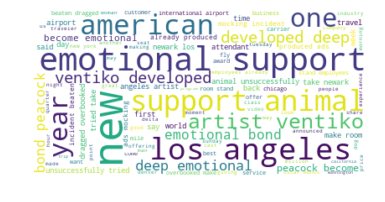

In [51]:
pos_wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(positive_words)
plt.figure()
plt.imshow(pos_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

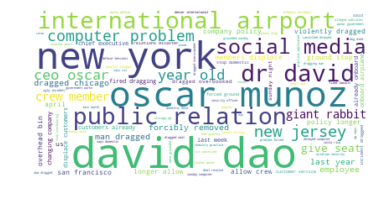

In [52]:
neg_wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(negative_words)
plt.figure()
plt.imshow(neg_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

    publication_timestamp  article_id
0              2017-01-02          37
1              2017-01-03          84
2              2017-01-04          11
3              2017-01-05          11
4              2017-01-06          16
5              2017-01-07           6
6              2017-01-08           1
7              2017-01-09          13
8              2017-01-10           9
9              2017-01-11          29
10             2017-01-12          28
11             2017-01-13          10
12             2017-01-14           4
13             2017-01-15           4
14             2017-01-16          30
15             2017-01-17          66
16             2017-01-18          36
17             2017-01-19          17
18             2017-01-20          19
19             2017-01-21           4
20             2017-01-22          12
21             2017-01-23         571
22             2017-01-24          19
23             2017-01-25          11
24             2017-01-26           3
25          

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



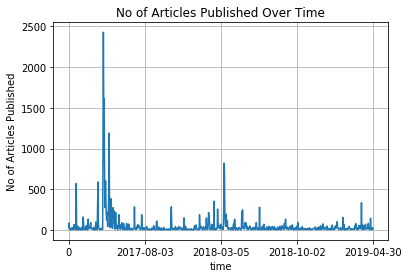

In [53]:
# Finding out the no of articles being published across the time
article_no_df = articles_df_copy_v5[['publication_timestamp', 'publisher_name', 'article_id', 'publisher_country', 'publisher_country_code']]

article_no_df['publication_timestamp'] = article_no_df.apply(lambda row: datetime.utcfromtimestamp(row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
 
# Get sum of sentiments over time
 
df = article_no_df[['publication_timestamp', 'article_id']].groupby('publication_timestamp').count().reset_index()
print(df)
 
interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [0, df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]
 
plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['article_id'])
plt.xlabel('time')
plt.ylabel('No of Articles Published')
plt.title('No of Articles Published Over Time')
 
plt.grid()
plt.show()


C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



    publication_timestamp  publisher_name
0              2017-01-02              34
1              2017-01-03              71
2              2017-01-04              11
3              2017-01-05              10
4              2017-01-06              16
5              2017-01-07               5
6              2017-01-08               1
7              2017-01-09               8
8              2017-01-10               9
9              2017-01-11              22
10             2017-01-12              26
11             2017-01-13              10
12             2017-01-14               4
13             2017-01-15               4
14             2017-01-16              18
15             2017-01-17              55
16             2017-01-18              33
17             2017-01-19              14
18             2017-01-20              18
19             2017-01-21               3
20             2017-01-22              12
21             2017-01-23             335
22             2017-01-24         

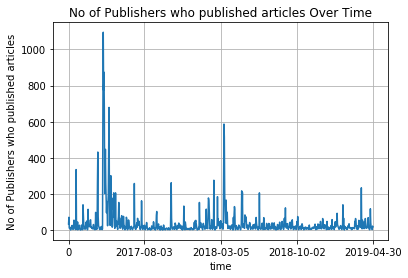

In [54]:
# Finding out the no of unique publishers that has shared the articles across the time

# Finding out the no of articles being shared across the time
article_no_df = articles_df_copy_v5[['publication_timestamp', 'publisher_name', 'article_id', 'publisher_country', 'publisher_country_code']]

article_no_df['publication_timestamp'] = article_no_df.apply(lambda row: datetime.utcfromtimestamp(row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
 
# Get sum of sentiments over time
 
df = article_no_df[['publication_timestamp', 'publisher_name']].groupby('publication_timestamp').publisher_name.nunique().reset_index()
print(df)
 
interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [0, df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]
 
plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['publisher_name'])
plt.xlabel('time')
plt.ylabel('No of Publishers who published articles')
plt.title('No of Publishers who published articles Over Time')
 
plt.grid()
plt.show()

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



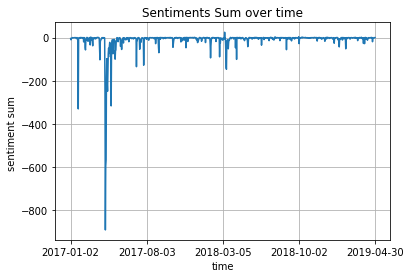

In [55]:
# Finding the SUM Sentiment Changes over time 

from datetime import datetime
df_senti = articles_df_copy_v5[['publication_timestamp', 'velocity', 'sentiment', 'li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments',]]
df_senti['publication_timestamp'] = df_senti.apply(lambda row: datetime.utcfromtimestamp(row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
df_cleaned = df_senti
# Get sum of sentiments over time
df = df_cleaned[['publication_timestamp', 'sentiment']].groupby('publication_timestamp').sum().reset_index()

interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['sentiment'])
plt.xlabel('time')
plt.ylabel('sentiment sum ')
plt.title('Sentiments Sum over time')

plt.grid()
plt.show()

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



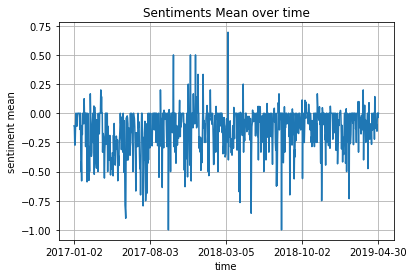

In [56]:
# Finding the AVG Sentiment Changes over time 

from datetime import datetime
df_senti = articles_df_copy_v5[['publication_timestamp', 'velocity', 'sentiment', 'li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments',]]
df_senti['publication_timestamp'] = df_senti.apply(lambda row: datetime.utcfromtimestamp(row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
df_cleaned = df_senti
# Get sum of sentiments over time
df = df_cleaned[['publication_timestamp', 'sentiment']].groupby('publication_timestamp').mean().reset_index()

interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['sentiment'])
plt.xlabel('time')
plt.ylabel('sentiment mean')
plt.title('Sentiments Mean over time')

plt.grid()
plt.show()

In [57]:
#Finding out how the publisher spread based on velocity 
# Average max velocity at publisher level
df_vel = articles_df_copy_v5[['publisher_name', 'max_velocity','velocity']]
df_vel = df_vel.groupby('publisher_name').mean().reset_index()
df_vel = df_vel.rename(columns={'max_velocity':'mean_max_velocity', 'velocity':'mean_velocity'})
print(df_vel)

                   publisher_name  mean_max_velocity  mean_velocity
0             100percentfedup.com         470.028981       0.040477
1                     1011now.com          45.688396       0.119883
2               1045freshradio.ca           0.000000       0.000000
3                   1079ishot.com           8.790335       0.348332
4                      10news.com          75.409198       0.122716
5                        10tv.com          55.541960      -0.694792
6                    1170kfaq.com           0.000000       0.000000
7                     11alive.com          60.331980       0.301629
8                      12160.info           0.000000       0.000000
9                      12news.com          46.930178       0.168601
10                  12newsnow.com          35.371606       0.185153
11                       12up.com         139.248223       0.048696
12                   1310news.com           0.000000       0.000000
13                      13abc.com          64.36

In [58]:
# Analyse based on velocity 
df_vel_max = df_vel[['publisher_name','mean_max_velocity']]
df_vel_final = df_vel[['publisher_name','mean_velocity']]

In [59]:
df_vel_max = df_vel_max.sort_values('mean_max_velocity', ascending=False)
df_vel_max.head(100)

,publisher_name,mean_max_velocity
2911,talkincloud.com,1857.481974
3006,thedodo.com,1763.511838
2354,occupydemocrats.com,1555.138767
903,duffelblog.com,1314.962433
2623,resistancereport.com,1216.288385
3300,unilad.co.uk,951.433515
3198,tmz.com,932.168484
293,barstoolsports.com,801.818763
2637,rinf.com,798.016649
2008,mensxp.com,745.924565


In [60]:
df_vel_final = df_vel_final.sort_values('mean_velocity', ascending=False)
df_vel_final.head(100)

,publisher_name,mean_velocity
855,devumi.com,234.239495
2911,talkincloud.com,175.712995
631,clashdaily.com,13.289068
2037,militarytimes.com,8.817049
2865,stockcharts.com,7.893828
1354,holmesreport.com,5.701214
1855,leehamnews.com,5.685328
85,abovetopsecret.com,5.637421
2098,mubasher.info,5.607226
3733,ycombinator.com,5.604657


In [61]:
#Finding out whether the speed the publisher spread their news articles differ based on the topics 
topics_spread = articles_df_copy_v5[['article_id','topics','max_velocity']]

In [62]:
topics_spread = (pd.concat({i: json_normalize(x) for i, x in topics_spread.pop('topics').items()}, sort=False)
         .reset_index(level=1, drop=True)
         .join(topics_spread)
         .reset_index(drop=True))

In [63]:
#Finding out how the publisher spread based on velocity 
# Average max velocity at publisher level
topics_spread_vel = topics_spread[['name', 'max_velocity']]
topics_spread_vel = topics_spread_vel.groupby('name').mean().reset_index()
topics_spread_vel = topics_spread_vel.rename(columns={'max_velocity':'mean_max_velocity'})
print(topics_spread_vel)

                   name  mean_max_velocity
0            Accounting          12.013648
1         Action Sports          19.103358
2                 Aging          54.565648
3    Agricultural Goods           3.003412
4     American Football          51.753972
5                   App          47.034064
6                  Arts          60.567884
7          Aus Football           0.722702
8                 Autos          83.220819
9              Baseball          33.944338
10           Basketball          32.818490
11               Beauty         110.628993
12              Biotech          57.729324
13               Brands          17.632713
14             Business          37.221874
15              Careers          84.608817
16            Celebrity         134.540398
17      Cloud Computing         142.877993
18        Combat Sports          15.419166
19          Commodities          46.333992
20              Cricket          47.484423
21              Culture          74.414899
22         

In [64]:
topics_spread_vel = topics_spread_vel.sort_values('mean_max_velocity', ascending=False)
topics_spread_vel.head(100)

,name,mean_max_velocity
45,For Him,259.125005
63,Left,225.345777
72,Mothers,225.318236
112,Viral Sites,221.145273
58,Ideas,186.665768
17,Cloud Computing,142.877993
16,Celebrity,134.540398
42,Fitness,122.023611
46,Fun,119.345085
36,Events,114.596642


In [65]:
#Slice to get top ranked topics 30 topics and see their mean max velocity
top_30 = topics_spread_vel[:30]
top_30.head(40)

,name,mean_max_velocity
45,For Him,259.125005
63,Left,225.345777
72,Mothers,225.318236
112,Viral Sites,221.145273
58,Ideas,186.665768
17,Cloud Computing,142.877993
16,Celebrity,134.540398
42,Fitness,122.023611
46,Fun,119.345085
36,Events,114.596642


In [66]:
import plotly.express as px
#data_canada = px.data.gapminder().query("country == 'Canada'")
fig = px.bar(top_30, x='name', y='mean_max_velocity')
fig.show()

#### Ques: Are there any general propagation patterns?
when the engagements start to go up, where and when an article gets picked up by social media, etc.?

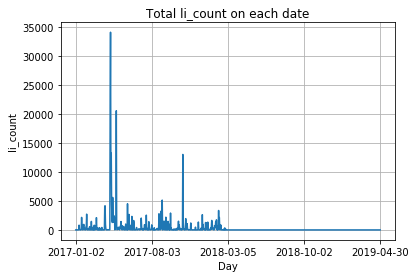

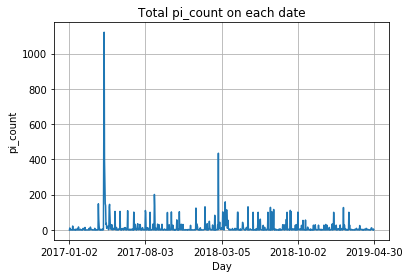

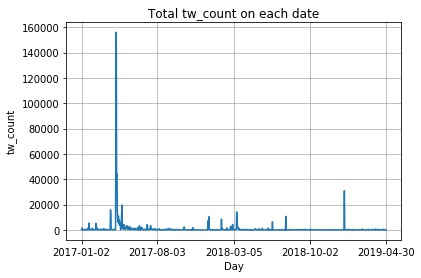

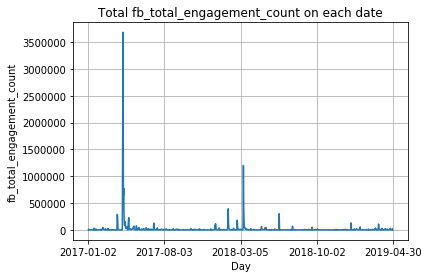

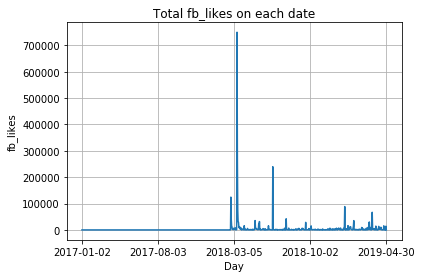

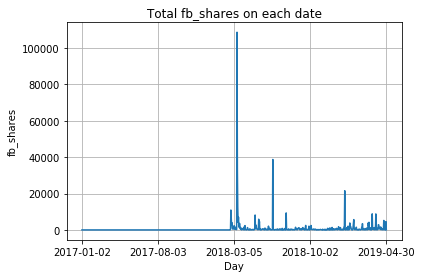

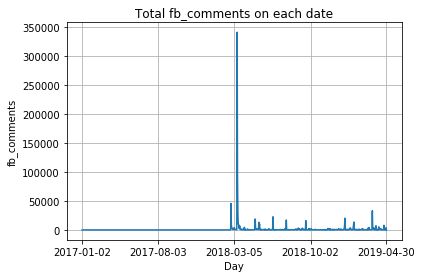

In [67]:
# Find the trend for all other metrics over time 
for i, cat in enumerate(['li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments']):
    df = df_cleaned[['publication_timestamp', cat]].groupby('publication_timestamp').sum().reset_index()

    interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
    tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

    plt.xticks(interval, tick_interval)
    plt.plot(range(len(df)), df[cat])
    plt.xlabel('Day')
    plt.ylabel(cat)
    plt.title('Total {} on each date'.format(cat))

    plt.grid()
    plt.show()


   publication_timestamp  fb_total_engagement_count
0             2018-01-01                         43
1             2018-01-02                       1887
2             2018-01-03                        281
3             2018-01-04                        152
4             2018-01-05                      38461
5             2018-01-06                      12771
6             2018-01-07                        952
7             2018-01-08                       2875
8             2018-01-09                        279
9             2018-01-10                        108
10            2018-01-11                       4380
11            2018-01-12                       3628
12            2018-01-13                        254
13            2018-01-14                          2
14            2018-01-15                        193
15            2018-01-16                       6720
16            2018-01-17                       3389
17            2018-01-18                       1240
18          

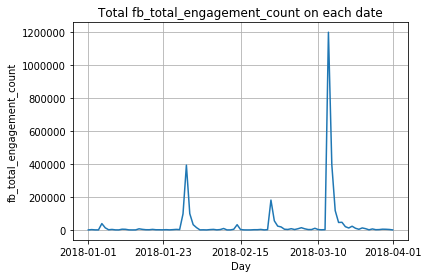

In [70]:
# Define a Function for end user to select specific window to look at 
from datetime import datetime
from datetime import timedelta
def get_plots_for_timeperiod(start_date, end_date, cat):
    dates = []
    start_date = datetime.strptime(start_date, '%Y-%m-%d')
    end_date = datetime.strptime(end_date, '%Y-%m-%d')
    while start_date <= end_date:
        dates.append(start_date)
        start_date += timedelta(days=1)
        
    dates = [d.strftime('%Y-%m-%d') for d in dates]
    df = df_cleaned[df_cleaned['publication_timestamp'].isin(dates)]
    df = df[['publication_timestamp', cat]].groupby('publication_timestamp').sum().reset_index()
    print(df)
    interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
    tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

    plt.xticks(interval, tick_interval)
    plt.plot(range(len(df)), df[cat])
    plt.xlabel('Day')
    plt.ylabel(cat)
    plt.title('Total {} on each date'.format(cat))

    plt.grid()
    plt.show()

get_plots_for_timeperiod('2018-01-01', '2018-04-01', 'fb_total_engagement_count')

In [65]:
#Understand the twitter follower influences profile which could help us understand the propagation patterns

In [66]:
#Follower Count 
fig = px.box(influencer_df_copyy_v1, y="followers_count", points="all")
fig.show()

In [67]:
#following_count
fig = px.box(influencer_df_copyy_v1, y="following_count", points="all")
fig.show()

In [68]:
#likes_count
fig = px.box(influencer_df_copyy_v1, y="likes_count", points="all")
fig.show()

In [69]:
#max_retweet_value
fig = px.box(influencer_df_copyy_v1, y="max_retweet_value", points="all")
fig.show()

In [70]:
#statuses_count
fig = px.box(influencer_df_copyy_v1, y="statuses_count", points="all")
fig.show()

In [71]:
#Feels that max_retweet_value and statuses_count are more relevant here so plot a scatter plot 
# x and y given as DataFrame columns
import plotly.express as px
fig = px.scatter(influencer_df_copyy_v1, x="statuses_count", y="max_retweet_value", hover_data=['twitter_handle'])
fig.show()


In [72]:
#Now lets try to find out how many of the articles are being shared by twitter influencers
## fill in nan values with 0 
article_influencer_final_df_agg['no_of_tweets_by_influencers'].fillna(0, inplace=True)
article_influencer_final_df_agg['no_unique_twitter_influencer'].fillna(0, inplace=True)
article_influencer_final_df_agg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39109 entries, 0 to 39108
Data columns (total 29 columns):
publisher_country               39109 non-null object
publisher_country_code          39109 non-null object
publisher_link                  39109 non-null object
publisher_name                  39109 non-null object
tw_count                        39109 non-null int64
tw_overperforming               1802 non-null float64
pi_count                        39109 non-null int64
li_count                        39109 non-null int64
fb_comments                     39109 non-null int64
fb_likes                        39109 non-null int64
fb_shares                       39109 non-null int64
fb_total_engagement_count       39109 non-null int64
fb_overperforming               4342 non-null float64
article_id                      39109 non-null object
authors                         24397 non-null object
contents                        39109 non-null object
excerpt                         39

In [73]:
article_influencer_final_df_agg['no_of_tweets_by_influencers'].value_counts()

0.0      32783
1.0       3554
2.0       1271
3.0        568
4.0        311
5.0        159
6.0        127
7.0         83
8.0         58
10.0        37
9.0         35
12.0        24
11.0        18
15.0        10
16.0         8
20.0         8
14.0         6
18.0         6
23.0         5
13.0         5
17.0         3
21.0         3
27.0         3
19.0         2
73.0         1
31.0         1
28.0         1
22.0         1
172.0        1
76.0         1
30.0         1
121.0        1
50.0         1
86.0         1
25.0         1
48.0         1
42.0         1
55.0         1
49.0         1
36.0         1
72.0         1
68.0         1
40.0         1
29.0         1
75.0         1
46.0         1
Name: no_of_tweets_by_influencers, dtype: int64

In [74]:
#since there are many articles that has not been tweeted by any twitter influencers (32783/39109), we will study the propogation patterns only for those articles that are being shared by the twitter influencers

article_influencer_final_df_non_agg_filter = article_influencer_final_df_non_agg[article_influencer_final_df_non_agg.twitter_id > 0 ]

article_influencer_final_df_agg_filter = article_influencer_final_df_agg[article_influencer_final_df_agg.no_of_tweets_by_influencers != 0]

#check if need check those not shared at all 
#df_non_tweet = df[df.no_of_tweets_by_influencers == 0]

In [75]:
article_influencer_final_df_agg_filter.head()

,publisher_country,publisher_country_code,publisher_link,publisher_name,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity,no_of_tweets_by_influencers,no_unique_twitter_influencer
0,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,6.0,5.0
1,United States,us,http://cnn.com,cnn.com,560,NaN,0,2,0,0,0,2063,NaN,336914f0-d1d6-11e6-ab89-c11942898bd6,"[Thom Patterson, Tara Mulholland]",Baggage handler trapped in cargo hold during f...,United Airlines is investigating how a baggage...,True,Baggage handler trapped in cargo hold during f...,http://i2.cdn.cnn.com/cnnnext/dam/assets/17010...,"aviation, Baggage handler trapped in cargo hol...",http://www.cnn.com/2017/01/03/aviation/trapped...,211.362491,1483461717000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 668, 'name'...",0.054310,1.0,1.0
3,New Zealand,nz,http://nzherald.co.nz,nzherald.co.nz,100,NaN,0,6,0,0,0,1737,NaN,76509020-d093-11e6-8d6f-9f4c7b0f94de,[Corazon Miller],United Airlines New Year's Day flight bound f...,A man was arrested after it was claimed he had...,False,Passenger arrested after United Airlines fligh...,http://media.nzherald.co.nz/webcontent/image/j...,"Business, Aviation, Airlines, Australia, Sydne...",http://www.nzherald.co.nz/business/news/articl...,97.729933,1483324244514,0.0,"[{'id': 2, 'name': 'News'}, {'id': 28, 'name':...",0.115518,1.0,1.0
6,United States,us,http://tmz.com,tmz.com,200,NaN,1,0,0,0,0,832,NaN,2c0aa320-d35e-11e6-b0a3-0310efe2a0d2,None,Carrie Fisher's in-flight medical emergency ha...,Carrie Fisher's in-flight medical emergency ha...,False,Carrie Fisher 911 Call -- Pilot Speeds up for ...,http://ll-media.tmz.com/2017/01/05/carrie-fish...,"Carrie Fisher, Carrie Fisher 911 call, Carrie ...",http://www.tmz.com/2017/01/05/carrie-fisher-91...,744.198504,1483631096000,0.0,"[{'id': 3, 'name': 'Entertainment'}, {'id': 69...",0.020690,2.0,1.0
7,United States,us,http://ktla.com,ktla.com,40,NaN,0,17,0,0,0,883,NaN,77343b10-d1e0-11e6-ab89-c11942898bd6,[CNN Wire],United Airlines is investigating how a baggage...,United Airlines is investigating how a baggage...,False,Trapped Baggage Handler Rode in Cargo Hold Dur...,https://tribktla.files.wordpress.com/2017/01/g...,"nation/world, charlotte douglas international ...",http://ktla.com/2017/01/03/baggage-handler-get...,63.972689,1483466939000,0.0,"[{'id': 2, 'name': 'News'}, {'id': 685, 'name'...",0.069023,3.0,2.0


In [76]:
#Next, we would like to find out the origin of the publsihed articles with relation to the influencer tweets engagement level (favrioute count and retweet count)

In [77]:
article_influencer_final_df_non_agg_filter['publisher_country'].replace('', np.nan, inplace=True)
article_influencer_final_df_non_agg_filter['publisher_country'].fillna("Unknown", inplace = True) 

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:6586: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:6130: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [78]:
article_influencer_final_df_agg_filter['publisher_country'].replace('', np.nan, inplace=True)
article_influencer_final_df_agg_filter['publisher_country'].fillna("Unknown", inplace = True) 

In [79]:
publisher_working_no_publisher = article_influencer_final_df_non_agg_filter[['publisher_country','publisher_name']].groupby('publisher_country').publisher_name.nunique().reset_index()
publisher_working_no_publisher = publisher_working_no_publisher.drop_duplicates()

In [80]:
publisher_working_no_publisher.rename(columns={'publisher_name':'total_unique_publisher_count'}, inplace=True)
publisher_working_no_publisher.head(10)

,publisher_country,total_unique_publisher_count
0,AA,4
1,Argentina,1
2,Australia,29
3,Belgium,1
4,Canada,47
5,China,7
6,EU,2
7,France,2
8,Germany,1
9,Guam,1


In [81]:
publisher_working_1 = article_influencer_final_df_non_agg_filter[['publisher_country','favourite_count', 'rt_count']].groupby('publisher_country').sum().reset_index()
publisher_working_1 = publisher_working_1.drop_duplicates()

publisher_working_2 = article_influencer_final_df_agg_filter[['publisher_country','no_of_tweets_by_influencers', 'no_unique_twitter_influencer']].groupby('publisher_country').sum().reset_index()
publisher_working_2 = publisher_working_2.drop_duplicates()

In [82]:
df_for_merge = article_influencer_final_df_agg_filter[['publisher_country', 'publisher_name']]
df_for_merge = df_for_merge.drop_duplicates()

In [83]:
combined_working = pd.merge(publisher_working_1, publisher_working_2 , how='inner', on='publisher_country')
combined_working = combined_working.drop_duplicates()
combined_working.info()
final_df = pd.merge(publisher_working_no_publisher, combined_working, how='inner', on='publisher_country')
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37 entries, 0 to 36
Data columns (total 5 columns):
publisher_country               37 non-null object
favourite_count                 37 non-null float64
rt_count                        37 non-null float64
no_of_tweets_by_influencers     37 non-null float64
no_unique_twitter_influencer    37 non-null float64
dtypes: float64(4), object(1)
memory usage: 1.7+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 37 entries, 0 to 36
Data columns (total 6 columns):
publisher_country               37 non-null object
total_unique_publisher_count    37 non-null int64
favourite_count                 37 non-null float64
rt_count                        37 non-null float64
no_of_tweets_by_influencers     37 non-null float64
no_unique_twitter_influencer    37 non-null float64
dtypes: float64(4), int64(1), object(1)
memory usage: 2.0+ KB


In [84]:
final_df = final_df.drop_duplicates()

In [85]:
final_df.head()

,publisher_country,total_unique_publisher_count,favourite_count,rt_count,no_of_tweets_by_influencers,no_unique_twitter_influencer
0,AA,4,48.0,62.0,16.0,12.0
1,Argentina,1,15.0,14.0,5.0,5.0
2,Australia,29,8636.0,6205.0,257.0,235.0
3,Belgium,1,14.0,17.0,4.0,2.0
4,Canada,47,13897.0,10312.0,633.0,561.0


In [86]:
#Next we use pccountry function tgt with our other coding logic which is generated based on dataset to come up with continent
import pycountry_convert as pc 

def get_continent(row):
    if row["publisher_country"] == 'SEA' or row["publisher_country"] == "MDE":
        continent_name = 'AS'
    elif row["publisher_country"] == 'EU':
        continent_name = 'EU'
    elif row["publisher_country"] == 'AA':
        continent_name = 'Unknown'
    elif row["publisher_country"] == 'Saint Kitts And Nevis' or row["publisher_country"] == 'U.S. Virgin Islands':
        continent_name = 'NA'
    elif row["publisher_country"] != 'Unknown':
        country_code = pc.country_name_to_country_alpha2(row["publisher_country"], cn_name_format="default")
        continent_name = pc.country_alpha2_to_continent_code(country_code)
    else:
        continent_name = 'Unknown'
    return continent_name

final_df['Continent Name'] = final_df.apply(get_continent, axis=1)
final_df.head()

,publisher_country,total_unique_publisher_count,favourite_count,rt_count,no_of_tweets_by_influencers,no_unique_twitter_influencer,Continent Name
0,AA,4,48.0,62.0,16.0,12.0,Unknown
1,Argentina,1,15.0,14.0,5.0,5.0,SA
2,Australia,29,8636.0,6205.0,257.0,235.0,OC
3,Belgium,1,14.0,17.0,4.0,2.0,EU
4,Canada,47,13897.0,10312.0,633.0,561.0,NA


In [87]:
final_df['rt_count_per_tweet'] = final_df['rt_count']/final_df['no_of_tweets_by_influencers']
final_df['favourite_count_per_tweet'] = final_df['favourite_count']/final_df['no_of_tweets_by_influencers']
final_df.head()

,publisher_country,total_unique_publisher_count,favourite_count,rt_count,no_of_tweets_by_influencers,no_unique_twitter_influencer,Continent Name,rt_count_per_tweet,favourite_count_per_tweet
0,AA,4,48.0,62.0,16.0,12.0,Unknown,3.875000,3.000000
1,Argentina,1,15.0,14.0,5.0,5.0,SA,2.800000,3.000000
2,Australia,29,8636.0,6205.0,257.0,235.0,OC,24.143969,33.603113
3,Belgium,1,14.0,17.0,4.0,2.0,EU,4.250000,3.500000
4,Canada,47,13897.0,10312.0,633.0,561.0,NA,16.290679,21.954186


In [88]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37 entries, 0 to 36
Data columns (total 9 columns):
publisher_country               37 non-null object
total_unique_publisher_count    37 non-null int64
favourite_count                 37 non-null float64
rt_count                        37 non-null float64
no_of_tweets_by_influencers     37 non-null float64
no_unique_twitter_influencer    37 non-null float64
Continent Name                  37 non-null object
rt_count_per_tweet              37 non-null float64
favourite_count_per_tweet       37 non-null float64
dtypes: float64(6), int64(1), object(2)
memory usage: 2.9+ KB


In [89]:
# Load data, define hover text and bubble size
import math
import plotly.graph_objects as go

final_df['continent_name'] = final_df['Continent Name']
hover_text = []
bubble_size = []

for index, row in final_df.iterrows():
    hover_text.append(('Country: {country} Continent: {cont}<br>'+
                      'Fav count/tweets: {fav}<br>'+
                      'RT count/tweets: {rt}<br>'+
                      'Number of publishers: {pub}').format(country=row['publisher_country'],cont=row['continent_name'],
                                            fav=row['favourite_count']/row['no_of_tweets_by_influencers'],
                                            rt=row['rt_count']/row['no_of_tweets_by_influencers'],
                                            pub=row['total_unique_publisher_count']))
    bubble_size.append(math.sqrt(row['total_unique_publisher_count']))

final_df['text'] = hover_text
final_df['size'] = bubble_size
sizeref = 2.*max(final_df['size'])/(100**2)

# Dictionary with dataframes for each continent
continent_names = ['OC','AF','SA','NA','EU','AS','Unknown']
continent_data = {continent:final_df.query("continent_name == '%s'" %continent)
                              for continent in continent_names}

# Create figure
fig = go.Figure()
for continent_name, continent in continent_data.items():
    fig.add_trace(go.Scatter(
        x=continent['favourite_count']/continent['no_of_tweets_by_influencers'], 
        y=continent['rt_count']/continent['no_of_tweets_by_influencers'],
        name=continent_name, text=continent['text'],
        marker_size=continent['size'],
        ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

fig.update_layout(
    title='',
    xaxis=dict(
        title='Total Fav Count / number of publishers',
        gridcolor='white',
        type='log',
        gridwidth=2,
    ),
    yaxis=dict(
        title='Total RT Count / number of publishers',
        gridcolor='white',
        gridwidth=2,
        type='log',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)
fig.show()


In [90]:
#Next, we would like to find out the topics of the articles published with relation to the influencer tweets engagement level (favrioute count and retweet count)

In [91]:
topic_for_article = topic_one_hot_encoding.copy()

In [92]:
article_influencer_final_df_non_agg_filter.head(10)

,publisher_country,publisher_country_code,publisher_link,publisher_name,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity,article_url,created_at,description,favourite_count,rt_count,twitter_url,followers_count,following_count,likes_count,max_retweet_value,statuses_count,twitter_handle,twitter_id,tweet_id
0,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1.483420e+12,A man who went on a racist and gay-bashing ran...,5.0,11.0,https://twitter.com/any/status/816149013628157952,37966.0,38871.0,8687.0,11.0,246720.0,Serpentine202,1.689253e+07,816149013628157952
1,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1.483419e+12,A man who went on a racist and gay-bashing ran...,0.0,2.0,https://twitter.com/any/status/816146335573442561,37966.0,38871.0,8687.0,11.0,246720.0,Serpentine202,1.689253e+07,816146335573442561
2,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1.483703e+12,A man who went on a racist and gay-bashing ran...,2.0,4.0,https://twitter.com/any/status/817335965584945153,1051.0,967.0,1438.0,4.0,1816.0,WonWcrime,4.005601e+09,817335965584945153
3,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1.483501e+12,A man who went on a racist and gay-bashing ran...,1.0,3.0,https://twitter.com/any/status/816489019148292096,5659.0,1178.0,4888.0,3.0,11886.0,AldReilly,3.378723e+08,816489019148292096
4,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1.483429e+12,A man who went on a racist a

In [93]:
article_influencer_final_df_agg_filter.info(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6326 entries, 0 to 39096
Data columns (total 29 columns):
publisher_country               6326 non-null object
publisher_country_code          6326 non-null object
publisher_link                  6326 non-null object
publisher_name                  6326 non-null object
tw_count                        6326 non-null int64
tw_overperforming               1461 non-null float64
pi_count                        6326 non-null int64
li_count                        6326 non-null int64
fb_comments                     6326 non-null int64
fb_likes                        6326 non-null int64
fb_shares                       6326 non-null int64
fb_total_engagement_count       6326 non-null int64
fb_overperforming               2183 non-null float64
article_id                      6326 non-null object
authors                         4547 non-null object
contents                        6326 non-null object
excerpt                         6326 non-null obj

In [94]:
topics_working_1 = article_influencer_final_df_non_agg_filter[['article_id','favourite_count', 'rt_count']].groupby('article_id').sum().reset_index()
topics_working_1 = topics_working_1.drop_duplicates()

In [95]:
topics_working_2 = article_influencer_final_df_agg_filter[['article_id', 'no_of_tweets_by_influencers','no_unique_twitter_influencer']]
topics_working_2 = topics_working_2.drop_duplicates()

In [96]:
topics_working_2.head()

,article_id,no_of_tweets_by_influencers,no_unique_twitter_influencer
0,757aab00-d16e-11e6-ab89-c11942898bd6,6.0,5.0
1,336914f0-d1d6-11e6-ab89-c11942898bd6,1.0,1.0
3,76509020-d093-11e6-8d6f-9f4c7b0f94de,1.0,1.0
6,2c0aa320-d35e-11e6-b0a3-0310efe2a0d2,2.0,1.0
7,77343b10-d1e0-11e6-ab89-c11942898bd6,3.0,2.0


In [97]:
combined_topic_working = pd.merge(topics_working_1, topics_working_2 , how='inner', on='article_id')
combined_topic_working = combined_topic_working.drop_duplicates()
combined_topic_working.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6326 entries, 0 to 6325
Data columns (total 5 columns):
article_id                      6326 non-null object
favourite_count                 6326 non-null float64
rt_count                        6326 non-null float64
no_of_tweets_by_influencers     6326 non-null float64
no_unique_twitter_influencer    6326 non-null float64
dtypes: float64(4), object(1)
memory usage: 296.5+ KB


In [98]:
final_topic_df = pd.merge(combined_topic_working, topic_for_article, how='left', on='article_id')
final_topic_df = final_topic_df.drop_duplicates()
final_topic_df['name'].fillna("Unknown", inplace = True) 
final_topic_df.head(1000)

,article_id,favourite_count,rt_count,no_of_tweets_by_influencers,no_unique_twitter_influencer,name
0,0002a7e0-a662-11e8-8bfc-ef989ddb8d11,15.0,19.0,2.0,1.0,News
1,0002a7e0-a662-11e8-8bfc-ef989ddb8d11,15.0,19.0,2.0,1.0,Life
2,00047e30-3fe3-11e7-a6c9-ebb7ea9adb61,3.0,5.0,2.0,2.0,Unknown
3,000e0cc0-4cc1-11e8-9821-5b7ee2cb8ec6,91.0,28.0,7.0,3.0,Cloud Computing
4,000e0cc0-4cc1-11e8-9821-5b7ee2cb8ec6,91.0,28.0,7.0,3.0,News
5,000e0cc0-4cc1-11e8-9821-5b7ee2cb8ec6,91.0,28.0,7.0,3.0,Tech Industry
6,000e0cc0-4cc1-11e8-9821-5b7ee2cb8ec6,91.0,28.0,7.0,3.0,Industries
7,000e0cc0-4cc1-11e8-9821-5b7ee2cb8ec6,91.0,28.0,7.0,3.0,Tech
8,000faf60-2b77-11e7-bf28-c11942898bd6,164.0,91.0,2.0,2.0,Business
9,000faf60-2b77-11e7-bf28-c11942898bd6,164.0,91.0,2.0,2.0,News


In [99]:
final_topic_df_grouped = final_topic_df[['name','favourite_count','rt_count','no_of_tweets_by_influencers','no_unique_twitter_influencer']].groupby('name').mean().reset_index()
final_topic_df_grouped = final_topic_df_grouped.drop_duplicates()

In [100]:
final_topic_df_grouped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96 entries, 0 to 95
Data columns (total 5 columns):
name                            96 non-null object
favourite_count                 96 non-null float64
rt_count                        96 non-null float64
no_of_tweets_by_influencers     96 non-null float64
no_unique_twitter_influencer    96 non-null float64
dtypes: float64(4), object(1)
memory usage: 4.5+ KB


In [101]:
final_topic_df_grouped.rename(columns={'favourite_count':'avg_favourite_count','rt_count':'avg_rt_count','no_of_tweets_by_influencers':'avg_no_of_tweets_by_influencers','no_unique_twitter_influencer':'avg_no_unique_twitter_influencer'}, inplace=True)
final_topic_df_grouped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96 entries, 0 to 95
Data columns (total 5 columns):
name                                96 non-null object
avg_favourite_count                 96 non-null float64
avg_rt_count                        96 non-null float64
avg_no_of_tweets_by_influencers     96 non-null float64
avg_no_unique_twitter_influencer    96 non-null float64
dtypes: float64(4), object(1)
memory usage: 4.5+ KB


In [102]:
final_topic_df_grouped.describe()

,avg_favourite_count,avg_rt_count,avg_no_of_tweets_by_influencers,avg_no_unique_twitter_influencer
count,96.000000,96.000000,96.000000,96.000000
mean,87.778352,56.157031,2.541626,2.123401
std,98.775533,62.361996,1.081836,0.850232
min,0.000000,1.000000,1.000000,1.000000
25%,23.134511,16.359703,1.888720,1.538617
50%,50.694895,32.785714,2.356115,2.000000
75%,110.532532,68.166667,3.107990,2.596762
max,471.590000,334.333333,6.687500,5.906250


Insights: 

as the avg_no_of_tweets_by_influencers and avg_no_unique_twitter_influencer have very small range and does not differ a lot across the different topics, we will only analyze the average favourite count and average retweet count

In [103]:
# Lets find the top 30 topics that are popular among influencers using avg_favourite_count
final_topic_df_grouped = final_topic_df_grouped.sort_values('avg_favourite_count', ascending=False)
final_topic_df_grouped.head(100)

#Get Top 30 Topics 
top_30_fav_ct = final_topic_df_grouped[:30]
top_30_fav_ct.head(40)

#Plot the bar graph
import plotly.express as px
fig = px.bar(top_30_fav_ct, x='name', y='avg_favourite_count')
fig.show()

In [104]:
# Lets find the top 30 topics that are popular among influencers using avg_retweet_count
final_topic_df_grouped = final_topic_df_grouped.sort_values('avg_rt_count', ascending=False)
final_topic_df_grouped.head(100)

#Get Top 30 Topics 
top_30_rt_ct = final_topic_df_grouped[:30]
top_30_rt_ct.head(40)

#Plot the bar graph
import plotly.express as px
fig = px.bar(top_30_rt_ct, x='name', y='avg_rt_count')
fig.show()

In [105]:
#Next we wish to see the GENERAL TREND for the social engagement level (favourite count, retweet count) with relation to tweet creation time after publication

In [106]:
general_trend_df = article_influencer_df_only_with_influencer.copy()

In [107]:
general_trend_df['time_delta_min'] = general_trend_df.apply(lambda row: ((row['created_at']/1000 - row['publication_timestamp']/1000))//60, axis=1)
general_trend_df['time_delta_hours'] = general_trend_df.apply(lambda row: ((row['created_at']/1000 - row['publication_timestamp']/1000))//3600, axis=1)
general_trend_df['time_delta_days'] = general_trend_df.apply(lambda row: ((row['created_at']/1000 - row['publication_timestamp']/1000))//(3600*24), axis=1)
general_trend_df.head(50)

,publisher_country,publisher_country_code,publisher_link,publisher_name,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity,article_url,created_at,description,favourite_count,rt_count,twitter_url,followers_count,following_count,likes_count,max_retweet_value,statuses_count,twitter_handle,twitter_id,tweet_id,time_delta_min,time_delta_hours,time_delta_days
0,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483420062000,A man who went on a racist and gay-bashing ran...,5,11,https://twitter.com/any/status/816149013628157952,37966,38871,8687,11,246720,Serpentine202,16892534,816149013628157952,29.0,0.0,0.0
1,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483419424000,A man who went on a racist and gay-bashing ran...,0,2,https://twitter.com/any/status/816146335573442561,37966,38871,8687,11,246720,Serpentine202,16892534,816146335573442561,18.0,0.0,0.0
2,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483703054000,A man who went on a racist and gay-bashing ran...,2,4,https://twitter.com/any/status/817335965584945153,1051,967,1438,4,1816,WonWcrime,4005600917,817335965584945153,4745.0,79.0,3.0
3,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483501126000,A man who went on a racist and gay-bashing ran...,1,3,https://twitter.com/any/status/816489019148292096,5659,1178,4888,3,11886,AldReilly,337872289,816489019148292096,1380.0,23.0,0.0
4,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,

In [108]:
#Try to plot a general trend for the no of tweets, total favourite count and retweet count based on publisher level
time_df_general = general_trend_df[(general_trend_df.time_delta_hours >= 0)]

time_df_working_1 = time_df_general[['publisher_name', 'favourite_count','rt_count']].groupby('publisher_name').sum().reset_index()

time_df_working_2 = time_df_general[['publisher_name', 'tweet_id']].groupby('publisher_name').count().reset_index()

time_df_working_3 = time_df_general[['publisher_name', 'time_delta_hours']].groupby('publisher_name').mean().reset_index()

time_df_working_4 = time_df_general[['publisher_name', 'time_delta_min']].groupby('publisher_name').mean().reset_index()

In [109]:
time_df_working_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1090 entries, 0 to 1089
Data columns (total 2 columns):
publisher_name      1090 non-null object
time_delta_hours    1090 non-null float64
dtypes: float64(1), object(1)
memory usage: 17.1+ KB


In [110]:
time_df_combined = pd.merge(time_df_working_1, time_df_working_2, how='inner', on='publisher_name')
time_df_general_working = pd.merge(time_df_combined, time_df_working_3, how='inner', on='publisher_name')
time_df_general_final = pd.merge(time_df_general_working, time_df_working_4, how='inner', on='publisher_name')

In [111]:
time_df_general_final.rename(columns={'time_delta_hours':'avg_time_delta_hours_per_tweet','favourite_count':'total_fav_count','rt_count':'total_rt_count','tweet_id':'total_tweets','time_delta_min':'avg_time_delta_min_per_tweet'}, inplace=True)
time_df_general_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1090 entries, 0 to 1089
Data columns (total 6 columns):
publisher_name                    1090 non-null object
total_fav_count                   1090 non-null int64
total_rt_count                    1090 non-null int64
total_tweets                      1090 non-null int64
avg_time_delta_hours_per_tweet    1090 non-null float64
avg_time_delta_min_per_tweet      1090 non-null float64
dtypes: float64(2), int64(3), object(1)
memory usage: 59.6+ KB


In [112]:
fig = px.scatter(time_df_general_final, x="avg_time_delta_hours_per_tweet", y="total_fav_count", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [113]:
fig = px.scatter(time_df_general_final, x="avg_time_delta_hours_per_tweet", y="total_rt_count", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [114]:
fig = px.scatter(time_df_general_final, x="avg_time_delta_hours_per_tweet", y="total_tweets", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [115]:
#Since there are a few outliers with avg_time_delta_hours_per_tweet over 1000 hr, we will narrow down

time_df_general_final_narrow = time_df_general_final[(time_df_general_final.avg_time_delta_hours_per_tweet <= 1000)]

In [116]:
fig = px.scatter(time_df_general_final_narrow, x="avg_time_delta_hours_per_tweet", y="total_fav_count", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [117]:
import plotly.express as px
fig = px.scatter(time_df_general_final_narrow, x="avg_time_delta_hours_per_tweet", y="total_rt_count", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [118]:
import plotly.express as px
fig = px.scatter(time_df_general_final_narrow, x="avg_time_delta_hours_per_tweet", y="total_tweets", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [119]:
#Since there most of the high impact tweets concentrated way below 100 hr, we will narrow down further to below 48 hr

time_df_general_final_narrow_further = time_df_general_final[(time_df_general_final.avg_time_delta_hours_per_tweet <= 48)]

In [120]:
fig = px.scatter(time_df_general_final_narrow_further, x="avg_time_delta_hours_per_tweet", y="total_fav_count", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [121]:
import plotly.express as px
fig = px.scatter(time_df_general_final_narrow_further, x="avg_time_delta_hours_per_tweet", y="total_rt_count", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [122]:
import plotly.express as px
fig = px.scatter(time_df_general_final_narrow_further, x="avg_time_delta_hours_per_tweet", y="total_tweets", hover_data=['publisher_name'])

#fig.update_layout(title='Total Favourite Count ')
fig.show()

In [123]:
#Next we wish to zoom in to TOP Articles (by total tweet count) and understand their social engagement level 

In [124]:
general_trend_df.head(100)

,publisher_country,publisher_country_code,publisher_link,publisher_name,tw_count,tw_overperforming,pi_count,li_count,fb_comments,fb_likes,fb_shares,fb_total_engagement_count,fb_overperforming,article_id,authors,contents,excerpt,has_video,headline,image_link,keywords,article_link,max_velocity,publication_timestamp,sentiment,topics,velocity,article_url,created_at,description,favourite_count,rt_count,twitter_url,followers_count,following_count,likes_count,max_retweet_value,statuses_count,twitter_handle,twitter_id,tweet_id,time_delta_min,time_delta_hours,time_delta_days
0,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483420062000,A man who went on a racist and gay-bashing ran...,5,11,https://twitter.com/any/status/816149013628157952,37966,38871,8687,11,246720,Serpentine202,16892534,816149013628157952,29.0,0.0,0.0
1,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483419424000,A man who went on a racist and gay-bashing ran...,0,2,https://twitter.com/any/status/816146335573442561,37966,38871,8687,11,246720,Serpentine202,16892534,816146335573442561,18.0,0.0,0.0
2,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483703054000,A man who went on a racist and gay-bashing ran...,2,4,https://twitter.com/any/status/817335965584945153,1051,967,1438,4,1816,WonWcrime,4005600917,817335965584945153,4745.0,79.0,3.0
3,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,1483501126000,A man who went on a racist and gay-bashing ran...,1,3,https://twitter.com/any/status/816489019148292096,5659,1178,4888,3,11886,AldReilly,337872289,816489019148292096,1380.0,23.0,0.0
4,United States,us,http://rawstory.com,rawstory.com,150,NaN,7,0,0,0,0,6059,NaN,757aab00-d16e-11e6-ab89-c11942898bd6,[Tom Boggioni],A man who went on a racist and gay-bashing ran...,A man who went on a racist and gay-bashing ran...,True,‘You want to hear me f*cking yelling?’: US-bou...,http://www.rawstory.com/wp-content/uploads/201...,,http://www.rawstory.com/2017/01/you-want-to-he...,54.541396,1483418302896,-1.0,"[{'id': 19, 'name': 'Opinion'}, {'id': 23, 'na...",0.174795,http://www.rawstory.com/2017/01/you-want-to-he...,

In [125]:
# Include favourite_count / rt_count
import plotly.graph_objects as go
fig = go.Figure()

top_performing_df = general_trend_df[(general_trend_df.time_delta_hours >= 0)][['article_id', 'tweet_id']].groupby(['article_id']).count().reset_index()
top_performing_df = top_performing_df.sort_values('tweet_id', ascending=False)
top_performing_articles = list(top_performing_df['article_id'])[:51]


time_df = general_trend_df[(general_trend_df.article_id.isin(top_performing_articles)) & (general_trend_df.time_delta_hours >= 0)]
time_df



time_grouped_df = time_df[(time_df.time_delta_hours < 48)].groupby(['article_id', 'time_delta_hours']).count().reset_index()
time_grouped_df



# plt.figure(1)
for i,art_id in enumerate(top_performing_articles):
    filtered_df = time_grouped_df[time_grouped_df.article_id == art_id]
    fig.add_trace(go.Scatter(x=filtered_df['time_delta_hours'], y=filtered_df['tweet_id'],name="Rank {}: {}".format(i+1, art_id), mode="lines"))
#     plt.plot(filtered_df['time_delta_hours'], filtered_df['tweet_id'])

# plt.title('Propogation profile of top articles shared via twitter in the first 48 hours')
# plt.xlabel("Hours Elapsed since article's publication")
# plt.ylabel("Tweets linking to the article")
# plt.show()
fig.update_xaxes(title_text="Time elapsed since article's publication (hours)")
fig.update_yaxes(title_text='Tweets made by influencers')

fig.show()


In [126]:
rt_fig = go.Figure()
fav_fig = go.Figure()

for i, art_id in enumerate(top_performing_articles):
    time_filtered_df = time_df[time_df.article_id==art_id]
    rts = [time_filtered_df[time_filtered_df.time_delta_hours <= hr].sum()['rt_count'] for hr in range(48)]
    favs = [time_filtered_df[time_filtered_df.time_delta_hours <= hr].sum()['favourite_count'] for hr in range(48)]
    rt_fig.add_trace(go.Scatter(x=list(range(48)), y=rts, name="Rank {}: {}".format(i+1, art_id), mode="lines"))
    fav_fig.add_trace(go.Scatter(x=list(range(48)), y=favs, name="Rank {}: {}".format(i+1, art_id), mode="lines"))

rt_fig.update_xaxes(title_text="Time elapsed since article's publication (hours)")
rt_fig.update_yaxes(title_text='Total Retweets on the article')
fav_fig.update_xaxes(title_text="Time elapsed since article's publication (hours)")
fav_fig.update_yaxes(title_text='Total Favourites on the article')
rt_fig.show()
fav_fig.show()

#### Ques: Are there any general propagation patterns?

Does the syndication / propagation pattern vary among different publishers and influencers segments that you develop?

 ##### Syndication Pattern Among Different Publishers

In [127]:
# firt we import the data and do data manipulation 
publisher_vary_data = pd.read_csv("final_publisher.csv") 
publisher_ref_working = articles_df_copy_v5[['article_id', 'sentiment', 'publisher_name', 'publication_timestamp']]
publisher_ref = pd.merge(publisher_ref_working, topic_one_hot_encoding_copy_final, how='left', on='article_id')
publisher_ref.replace('', np.nan, inplace=True)
publisher_ref.fillna("0", inplace = True) 

In [128]:
publisher_ref_missing = publisher_ref.isnull().sum()
publisher_ref_missing

article_id                 0
sentiment                  0
publisher_name             0
publication_timestamp      0
name_Accounting            0
name_Action Sports         0
name_Aging                 0
name_Agricultural Goods    0
name_American Football     0
name_App                   0
name_Arts                  0
name_Aus Football          0
name_Autos                 0
name_Baseball              0
name_Basketball            0
name_Beauty                0
name_Biotech               0
name_Brands                0
name_Business              0
name_Careers               0
name_Celebrity             0
name_Cloud Computing       0
name_Combat Sports         0
name_Commodities           0
name_Cricket               0
name_Culture               0
name_Currencies            0
name_Cycling               0
name_DIY                   0
name_Data Storage          0
name_Defence               0
name_Design                0
name_Dev                   0
name_Economics             0
name_Education

In [129]:
# We look at the topics published by the different segments and whether they are very different
publisher_topic_df_pattern = publisher_ref.drop(['sentiment', 'article_id', 'publication_timestamp'], axis=1)
test = publisher_topic_df_pattern.iloc[:,1:116].astype(int)
#publisher_topic_df_pattern.head(10)

In [130]:
test.head(10)

,name_Accounting,name_Action Sports,name_Aging,name_Agricultural Goods,name_American Football,name_App,name_Arts,name_Aus Football,name_Autos,name_Baseball,name_Basketball,name_Beauty,name_Biotech,name_Brands,name_Business,name_Careers,name_Celebrity,name_Cloud Computing,name_Combat Sports,name_Commodities,name_Cricket,name_Culture,name_Currencies,name_Cycling,name_DIY,name_Data Storage,name_Defence,name_Design,name_Dev,name_Economics,name_Education,name_Electronics,name_Emerging Markets,name_Energy,name_Entertainment,name_Environment,name_Events,name_Fake News,name_Fashion,name_Fathers,name_Finance,name_Financial Products,name_Fitness,name_Food & Drink,name_For Her,name_For Him,name_Fun,name_Funds,name_Gadgets,name_Gaming,name_Golf,name_Great Outdoors,name_Hardware,name_Health,name_Health Care,name_Homemaking,name_Hunting & Fishing,name_Ice Hockey,name_Ideas,name_Industries,name_Insurance,name_International,name_Latino,name_Left,name_Legal,name_Life,name_Luxury,name_Marketing,name_Markets,name_Martial Arts,name_Media,name_Mining,name_Mothers,name_Motorsports,name_Movies,name_Music,name_Networking,name_News,name_Oil and Gas,name_Opinion,name_Parenting,name_People,name_Personal Finance,name_Pets,name_Politics,name_Private Equity,name_Psychology,name_Rates and Bonds,name_Real Estate,name_Religion,name_Renewable Energy,name_Retail,name_Retirement,name_Right,name_Rugby,name_Science,name_Soccer,name_Society,name_Software,name_Sports,name_Startups,name_Stocks,name_Strategy,name_TV,name_Tech,name_Tech Industry,name_Teens,name_Telecom,name_Tennis,name_The Wire,name_Transport,name_Travel,name_Viral Sites,name_Weather,name_Wireless - Mobile
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0


In [131]:
publisher_topic_df_pattern_final = pd.merge(publisher_topic_df_pattern, test, left_index=True, right_index=True)

In [132]:
publisher_topic_df_pattern_final.head(10)

,publisher_name,name_Accounting_x,name_Action Sports_x,name_Aging_x,name_Agricultural Goods_x,name_American Football_x,name_App_x,name_Arts_x,name_Aus Football_x,name_Autos_x,name_Baseball_x,name_Basketball_x,name_Beauty_x,name_Biotech_x,name_Brands_x,name_Business_x,name_Careers_x,name_Celebrity_x,name_Cloud Computing_x,name_Combat Sports_x,name_Commodities_x,name_Cricket_x,name_Culture_x,name_Currencies_x,name_Cycling_x,name_DIY_x,name_Data Storage_x,name_Defence_x,name_Design_x,name_Dev_x,name_Economics_x,name_Education_x,name_Electronics_x,name_Emerging Markets_x,name_Energy_x,name_Entertainment_x,name_Environment_x,name_Events_x,name_Fake News_x,name_Fashion_x,name_Fathers_x,name_Finance_x,name_Financial Products_x,name_Fitness_x,name_Food & Drink_x,name_For Her_x,name_For Him_x,name_Fun_x,name_Funds_x,name_Gadgets_x,name_Gaming_x,name_Golf_x,name_Great Outdoors_x,name_Hardware_x,name_Health_x,name_Health Care_x,name_Homemaking_x,name_Hunting & Fishing_x,name_Ice Hockey_x,name_Ideas_x,name_Industries_x,name_Insurance_x,name_International _x,name_Latino_x,name_Left_x,name_Legal_x,name_Life_x,name_Luxury_x,name_Marketing_x,name_Markets_x,name_Martial Arts_x,name_Media_x,name_Mining_x,name_Mothers_x,name_Motorsports_x,name_Movies_x,name_Music_x,name_Networking_x,name_News_x,name_Oil and Gas_x,name_Opinion_x,name_Parenting_x,name_People_x,name_Personal Finance_x,name_Pets_x,name_Politics_x,name_Private Equity_x,name_Psychology_x,name_Rates and Bonds_x,name_Real Estate_x,name_Religion_x,name_Renewable Energy_x,name_Retail_x,name_Retirement_x,name_Right_x,name_Rugby_x,name_Science_x,name_Soccer_x,name_Society_x,name_Software_x,name_Sports_x,name_Startups_x,name_Stocks_x,name_Strategy_x,name_TV_x,name_Tech_x,name_Tech Industry_x,name_Teens_x,name_Telecom_x,name_Tennis_x,name_The Wire_x,name_Transport_x,name_Travel_x,name_Viral Sites_x,name_Weather_x,name_Wireless - Mobile_x,name_Accounting_y,name_Action Sports_y,name_Aging_y,name_Agricultural Goods_y,name_American Football_y,name_App_y,name_Arts_y,name_Aus Football_y,name_Autos_y,name_Baseball_y,name_Basketball_y,name_Beauty_y,name_Biotech_y,name_Brands_y,name_Business_y,name_Careers_y,name_Celebrity_y,name_Cloud Computing_y,name_Combat Sports_y,name_Commodities_y,name_Cricket_y,name_Culture_y,name_Currencies_y,name_Cycling_y,name_DIY_y,name_Data Storage_y,name_Defence_y,name_Design_y,name_Dev_y,name_Economics_y,name_Education_y,name_Electronics_y,name_Emerging Markets_y,name_Energy_y,name_Entertainment_y,name_Environment_y,name_Events_y,name_Fake News_y,name_Fashion_y,name_Fathers_y,name_Finance_y,name_Financial Products_y,name_Fitness_y,name_Food & Drink_y,name_For Her_y,name_For Him_y,name_Fun_y,name_Funds_y,name_Gadgets_y,name_Gaming_y,name_Golf_y,name_Great Outdoors_y,name_Hardware_y,name_Health_y,name_Health Care_y,name_Homemaking_y,name_Hunting & Fishing_y,name_Ice Hockey_y,name_Ideas_y,name_Industries_y,name_Insurance_y,name_International _y,name_Latino_y,name_Left_y,name_Legal_y,name_Life_y,name_Luxury_y,name_Marketing_y,name_Markets_y,name_Martial Arts_y,name_Media_y,name_Mining_y,name_Mothers_y,name_Motorsports_y,name_Movies_y,name_Music_y,name_Networking_y,name_News_y,name_Oil and Gas_y,name_Opinion_y,name_Parenting_y,name_People_y,name_Personal Finance_y,name_Pets_y,name_Politics_y,name_Private Equity_y,name_Psychology_y,name_Rates and Bonds_y,name_Real Estate_y,name_Religion_y,name_Renewable Energy_y,name_Retail_y,name_Retirement_y,name_Right_y,name_Rugby_y,name_Science_y,name_Soccer_y,name_Society_y,name_Software_y,name_Sports_y,name_Startups_y,name_Stocks_y,name_Strategy_y,name_TV_y,name_Tech_y,name_Tech Industry_y,name_Teens_y,name_Telecom_y,name_Tennis_y,name_The Wire_y,name_Transport_y,name_Travel_y,name_Viral Sites_y,name_Weather_y,name_Wireless - Mobile_y
0,rawstory.com,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [133]:
publisher_topic_df_pattern_final_agg = publisher_topic_df_pattern_final.groupby('publisher_name').mean().reset_index()

In [134]:
publisher_vary_data = publisher_vary_data[['publisher_name','Cluster_No']]
#since there are multiple countries attached to some publisher, we will treat the publisher with diff countries uniquely

In [135]:
publisher_topic_df_pattern_final_agg_final = pd.merge(publisher_topic_df_pattern_final_agg, publisher_vary_data, how = 'right', on ='publisher_name')
publisher_topic_df_pattern_final_agg_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5080 entries, 0 to 5079
Columns: 117 entries, publisher_name to Cluster_No
dtypes: float64(115), int64(1), object(1)
memory usage: 4.6+ MB


In [136]:
#group by cluster
publisher_topic_df_pattern_final_agg_final_final = publisher_topic_df_pattern_final_agg_final.drop(['publisher_name'], axis=1)
cluster_topics_final = publisher_topic_df_pattern_final_agg_final_final.groupby('Cluster_No').mean().reset_index()

In [137]:
cluster_topics_final.head()

,Cluster_No,name_Accounting_y,name_Action Sports_y,name_Aging_y,name_Agricultural Goods_y,name_American Football_y,name_App_y,name_Arts_y,name_Aus Football_y,name_Autos_y,name_Baseball_y,name_Basketball_y,name_Beauty_y,name_Biotech_y,name_Brands_y,name_Business_y,name_Careers_y,name_Celebrity_y,name_Cloud Computing_y,name_Combat Sports_y,name_Commodities_y,name_Cricket_y,name_Culture_y,name_Currencies_y,name_Cycling_y,name_DIY_y,name_Data Storage_y,name_Defence_y,name_Design_y,name_Dev_y,name_Economics_y,name_Education_y,name_Electronics_y,name_Emerging Markets_y,name_Energy_y,name_Entertainment_y,name_Environment_y,name_Events_y,name_Fake News_y,name_Fashion_y,name_Fathers_y,name_Finance_y,name_Financial Products_y,name_Fitness_y,name_Food & Drink_y,name_For Her_y,name_For Him_y,name_Fun_y,name_Funds_y,name_Gadgets_y,name_Gaming_y,name_Golf_y,name_Great Outdoors_y,name_Hardware_y,name_Health_y,name_Health Care_y,name_Homemaking_y,name_Hunting & Fishing_y,name_Ice Hockey_y,name_Ideas_y,name_Industries_y,name_Insurance_y,name_International _y,name_Latino_y,name_Left_y,name_Legal_y,name_Life_y,name_Luxury_y,name_Marketing_y,name_Markets_y,name_Martial Arts_y,name_Media_y,name_Mining_y,name_Mothers_y,name_Motorsports_y,name_Movies_y,name_Music_y,name_Networking_y,name_News_y,name_Oil and Gas_y,name_Opinion_y,name_Parenting_y,name_People_y,name_Personal Finance_y,name_Pets_y,name_Politics_y,name_Private Equity_y,name_Psychology_y,name_Rates and Bonds_y,name_Real Estate_y,name_Religion_y,name_Renewable Energy_y,name_Retail_y,name_Retirement_y,name_Right_y,name_Rugby_y,name_Science_y,name_Soccer_y,name_Society_y,name_Software_y,name_Sports_y,name_Startups_y,name_Stocks_y,name_Strategy_y,name_TV_y,name_Tech_y,name_Tech Industry_y,name_Teens_y,name_Telecom_y,name_Tennis_y,name_The Wire_y,name_Transport_y,name_Travel_y,name_Viral Sites_y,name_Weather_y,name_Wireless - Mobile_y
0,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.027778,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.111111,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.00000,0.250000,0.000000,0.000000,0.000000,0.000000,0.138889,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.222222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.035714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.037037,0.000000,0.000000,0.00000,0.000000,0.000000,0.011905,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.027778,0.000000,0.000000,0.000000,0.000000,0.035714,0.180920,0.000000,0.000000,0.000000,0.000000,0.00000,0.027778,0.000000,0.000000,0.002332,0.000000,0.168769,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.360185,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031746,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.053571,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,3,0.000007,0.000825,0.000322,

In [138]:
#Transpose and set index 
cluster_topics_final_tranpose = cluster_topics_final.transpose().reset_index()
cluster_topics_final_tranpose.columns.name = None

In [139]:
cluster_topics_final_tranpose.to_csv('cluster_topics_final_tranpose.csv', index = False)

As some of the publisher has different country origin for tweets, we will remove the publisher with multiple country origin which result in them having very different clusters

In [140]:
# Get Sum of Sentiment Changes over time for these segments 

In [141]:
final_publisher_vary_data_filter = pd.read_csv("Publisher_scores2.csv") 
final_publisher_vary_data_filter_copy = final_publisher_vary_data_filter[['publisher_name','Segment_No']]
final_publisher_vary_data_filter_copy.drop_duplicates()

,publisher_name,Segment_No
0,1011now.com,1
1,24-7pressrelease.com,2
2,247sports.com,2
3,12160.info,2
4,10news.com,1
5,4-traders.com,2
6,app.com,3
7,wavy.com,4
8,4029tv.com,2
9,100percentfedup.com,1


In [142]:
publisher_ref_sentiment = pd.merge(publisher_ref_working, final_publisher_vary_data_filter_copy, how='inner', on='publisher_name')
# publisher_ref.replace('', np.nan, inplace=True)
# publisher_ref.fillna("0", inplace = True) 

In [143]:
publisher_ref_sentiment.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39109 entries, 0 to 39108
Data columns (total 5 columns):
article_id               39109 non-null object
sentiment                39109 non-null float64
publisher_name           39109 non-null object
publication_timestamp    39109 non-null int64
Segment_No               39109 non-null int64
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [144]:
publisher_segment_1 = publisher_ref_sentiment[publisher_ref_sentiment.Segment_No == 1]
publisher_segment_2 = publisher_ref_sentiment[publisher_ref_sentiment.Segment_No == 2]
publisher_segment_3 = publisher_ref_sentiment[publisher_ref_sentiment.Segment_No == 3]
publisher_segment_4 = publisher_ref_sentiment[publisher_ref_sentiment.Segment_No == 4]



C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



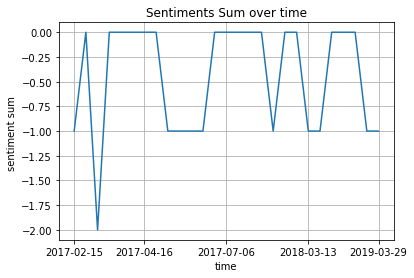

In [145]:
#Plot for Segment 1 
from datetime import datetime
# df_senti = articles_df_copy_v5[['publication_timestamp', 'velocity', 'sentiment', 'li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments',]]
publisher_segment_1['publication_timestamp'] = publisher_segment_1.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000)).strftime('%Y-%m-%d'), axis=1)
df_cleaned = publisher_segment_1
# Get sum of sentiments over time
df = df_cleaned[['publication_timestamp', 'sentiment']].groupby('publication_timestamp').sum().reset_index()

interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['sentiment'])
plt.xlabel('time')
plt.ylabel('sentiment sum ')
plt.title('Sentiments Sum over time')

plt.grid()
plt.show()

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



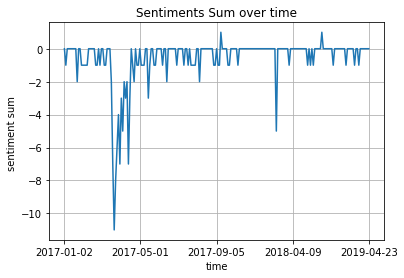

In [146]:
#Plot for Segment 2 
from datetime import datetime
# df_senti = articles_df_copy_v5[['publication_timestamp', 'velocity', 'sentiment', 'li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments',]]
publisher_segment_2['publication_timestamp'] = publisher_segment_2.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000)).strftime('%Y-%m-%d'), axis=1)
df_cleaned = publisher_segment_2
# Get sum of sentiments over time
df = df_cleaned[['publication_timestamp', 'sentiment']].groupby('publication_timestamp').sum().reset_index()

interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['sentiment'])
plt.xlabel('time')
plt.ylabel('sentiment sum ')
plt.title('Sentiments Sum over time')

plt.grid()
plt.show()

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



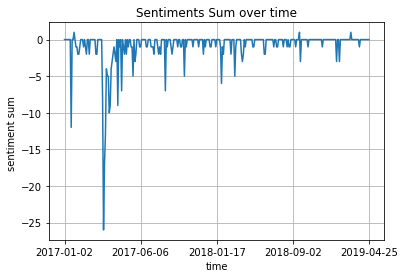

In [147]:
#Plot for Segment 3 
from datetime import datetime
# df_senti = articles_df_copy_v5[['publication_timestamp', 'velocity', 'sentiment', 'li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments',]]
publisher_segment_3['publication_timestamp'] = publisher_segment_3.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000)).strftime('%Y-%m-%d'), axis=1)
df_cleaned = publisher_segment_3
# Get sum of sentiments over time
df = df_cleaned[['publication_timestamp', 'sentiment']].groupby('publication_timestamp').sum().reset_index()

interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['sentiment'])
plt.xlabel('time')
plt.ylabel('sentiment sum ')
plt.title('Sentiments Sum over time')

plt.grid()
plt.show()

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



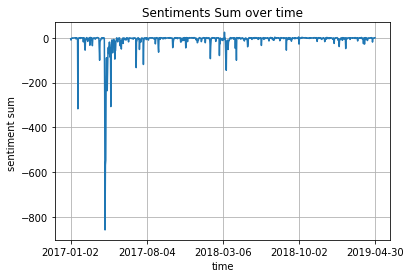

In [148]:
#Plot for Segment 4 
from datetime import datetime
# df_senti = articles_df_copy_v5[['publication_timestamp', 'velocity', 'sentiment', 'li_count', 'pi_count', 'tw_count', 'fb_total_engagement_count', 'fb_likes', 'fb_shares', 'fb_comments',]]
publisher_segment_4['publication_timestamp'] = publisher_segment_4.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000)).strftime('%Y-%m-%d'), axis=1)
df_cleaned = publisher_segment_4
# Get sum of sentiments over time
df = df_cleaned[['publication_timestamp', 'sentiment']].groupby('publication_timestamp').sum().reset_index()

interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [df['publication_timestamp'][0], df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]

plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['sentiment'])
plt.xlabel('time')
plt.ylabel('sentiment sum ')
plt.title('Sentiments Sum over time')

plt.grid()
plt.show()

In [149]:
# Finding out the no of articles being published across the time for different segments

In [151]:
publisher_segment_1.head()

,article_id,sentiment,publisher_name,publication_timestamp,Segment_No
22669,e8a8e890-f391-11e6-83ee-d34e81d8cad2,-1.0,10news.com,2017-02-15,1
22670,3de72370-1e04-11e7-aab2-d37f0d6d833b,0.0,10news.com,2017-04-10,1
22671,f8207af0-1f37-11e7-8654-371974c75eb5,0.0,10news.com,2017-04-11,1
22672,8aefe0d0-1ee5-11e7-ad4b-8b2016dfe8ad,-1.0,10news.com,2017-04-11,1
22673,7b764aa0-1f89-11e7-99cb-d37f0d6d833b,0.0,10news.com,2017-04-12,1


   publication_timestamp  article_id
0             2017-02-15           1
1             2017-04-10           1
2             2017-04-11           4
3             2017-04-12           3
4             2017-04-13           2
5             2017-04-14           1
6             2017-04-16           1
7             2017-04-17           1
8             2017-04-22           1
9             2017-04-26           2
10            2017-04-27           3
11            2017-05-19           1
12            2017-05-24           1
13            2017-07-06           1
14            2017-07-13           1
15            2017-07-25           1
16            2017-07-26           1
17            2017-12-26           1
18            2018-01-05           1
19            2018-02-11           1
20            2018-03-13           1
21            2018-06-27           1
22            2018-07-27           1
23            2018-08-31           1
24            2019-01-05           1
25            2019-01-21           1
2

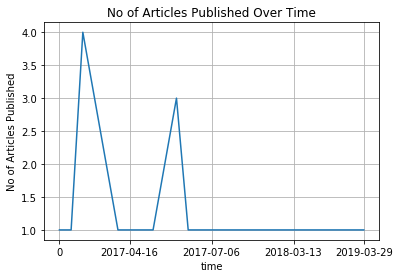

In [152]:
# Segment 1 
# publisher_segment_1['publication_timestamp'] = publisher_segment_1.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)

df = publisher_segment_1[['publication_timestamp', 'article_id']].groupby('publication_timestamp').count().reset_index()
print(df)
 
interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [0, df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]
 
plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['article_id'])
plt.xlabel('time')
plt.ylabel('No of Articles Published')
plt.title('No of Articles Published Over Time')
 
plt.grid()
plt.show()

    publication_timestamp  article_id
0              2017-01-02           1
1              2017-01-05           1
2              2017-01-06           1
3              2017-01-08           1
4              2017-01-11           2
5              2017-01-12           1
6              2017-01-16           2
7              2017-01-18           2
8              2017-01-19           1
9              2017-01-23           5
10             2017-01-25           2
11             2017-01-27           1
12             2017-02-08           2
13             2017-02-12           3
14             2017-02-14           2
15             2017-02-16           2
16             2017-02-21           1
17             2017-02-24           1
18             2017-02-26           1
19             2017-02-27           2
20             2017-03-02           1
21             2017-03-05           2
22             2017-03-06           2
23             2017-03-07           2
24             2017-03-08           1
25          

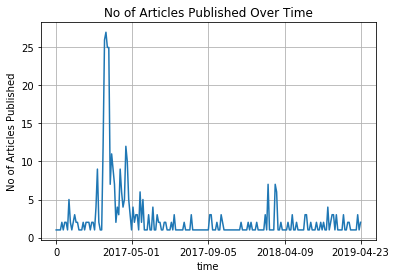

In [153]:
# Segment 2 
# publisher_segment_2['publication_timestamp'] = publisher_segment_2.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
 

df = publisher_segment_2[['publication_timestamp', 'article_id']].groupby('publication_timestamp').count().reset_index()
print(df)
 
interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [0, df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]
 
plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['article_id'])
plt.xlabel('time')
plt.ylabel('No of Articles Published')
plt.title('No of Articles Published Over Time')
 
plt.grid()
plt.show()

    publication_timestamp  article_id
0              2017-01-02           1
1              2017-01-03           6
2              2017-01-13           1
3              2017-01-17           4
4              2017-01-18           1
5              2017-01-19           2
6              2017-01-20           2
7              2017-01-23          24
8              2017-01-24           1
9              2017-01-27           2
10             2017-01-30           2
11             2017-02-02           1
12             2017-02-04           1
13             2017-02-08           1
14             2017-02-12           5
15             2017-02-13           3
16             2017-02-15           1
17             2017-02-20           1
18             2017-02-21           2
19             2017-02-26           1
20             2017-02-27           4
21             2017-03-04           2
22             2017-03-05           2
23             2017-03-06           6
24             2017-03-08           1
25          

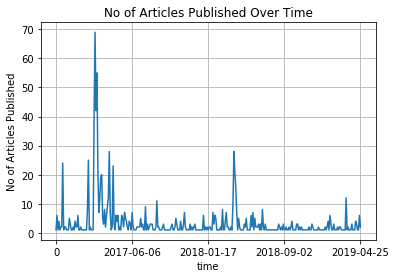

In [155]:
# Segment 3 
# publisher_segment_3['publication_timestamp'] = publisher_segment_3.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
 
df = publisher_segment_3[['publication_timestamp', 'article_id']].groupby('publication_timestamp').count().reset_index()
print(df)
 
interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [0, df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]
 
plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['article_id'])
plt.xlabel('time')
plt.ylabel('No of Articles Published')
plt.title('No of Articles Published Over Time')
 
plt.grid()
plt.show()

    publication_timestamp  article_id
0              2017-01-02          35
1              2017-01-03          78
2              2017-01-04          11
3              2017-01-05          10
4              2017-01-06          15
5              2017-01-07           6
6              2017-01-09          13
7              2017-01-10           9
8              2017-01-11          27
9              2017-01-12          27
10             2017-01-13           9
11             2017-01-14           4
12             2017-01-15           4
13             2017-01-16          28
14             2017-01-17          62
15             2017-01-18          33
16             2017-01-19          14
17             2017-01-20          17
18             2017-01-21           4
19             2017-01-22          12
20             2017-01-23         542
21             2017-01-24          18
22             2017-01-25           9
23             2017-01-26           3
24             2017-01-27          44
25          

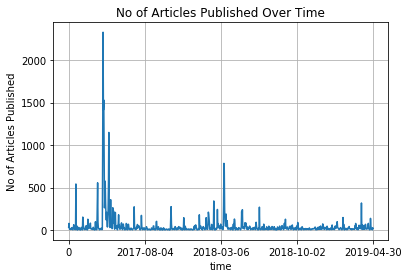

In [156]:
# Segment 4
# publisher_segment_4['publication_timestamp'] = publisher_segment_4.apply(lambda row: datetime.utcfromtimestamp((row['publication_timestamp']/1000).strftime('%Y-%m-%d'), axis=1)
 
df = publisher_segment_4[['publication_timestamp', 'article_id']].groupby('publication_timestamp').count().reset_index()
print(df)
 
interval = [0, int((0.25)*len(df)), int((0.5) * len(df)), int((0.75) * len(df)), len(df)-1]
tick_interval = [0, df['publication_timestamp'][int((0.25)*len(df))], df['publication_timestamp'][int((0.5) * len(df))], df['publication_timestamp'][int((0.75) * len(df))], df['publication_timestamp'][len(df)-1]]
 
plt.xticks(interval, tick_interval)
plt.plot(range(len(df)), df['article_id'])
plt.xlabel('time')
plt.ylabel('No of Articles Published')
plt.title('No of Articles Published Over Time')
 
plt.grid()
plt.show()

 ##### Propagation Pattern Among Different Influencers

In [162]:
# firt we import the data and do data manipulation 
influencer_vary_data = pd.read_excel("Clustered_Distinct_Influencer_Data.xlsx", sheet_name='Sheet 1') 
#influencer_vary_data = pd.read_csv("influencer_segment_final.csv",encoding='utf-8') 
influencer_vary_data = influencer_vary_data.drop_duplicates()
influencer_vary_data_filter = influencer_vary_data[['twitter_id','Segment_No']]
influencer_vary_data_filter = influencer_vary_data_filter.drop_duplicates()
influencer_vary_data_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8347 entries, 0 to 8346
Data columns (total 2 columns):
twitter_id    8347 non-null int64
Segment_No    8347 non-null int64
dtypes: int64(2)
memory usage: 195.6 KB


In [163]:
influencer_df_copyy_v1_filter = influencer_df_copyy_v1[['twitter_id','favourite_count','rt_count','tweet_id']]
influencer_df_copyy_v1_filter = influencer_df_copyy_v1_filter.drop_duplicates()
influencer_df_copyy_v1_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21952 entries, 0 to 21971
Data columns (total 4 columns):
twitter_id         21952 non-null int64
favourite_count    21952 non-null int64
rt_count           21952 non-null int64
tweet_id           21952 non-null object
dtypes: int64(3), object(1)
memory usage: 857.5+ KB


In [164]:
influencer_ref = pd.merge(influencer_df_copyy_v1_filter, influencer_vary_data_filter, how='inner', on='twitter_id')

In [165]:
influencer_ref.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21039 entries, 0 to 21038
Data columns (total 5 columns):
twitter_id         21039 non-null int64
favourite_count    21039 non-null int64
rt_count           21039 non-null int64
tweet_id           21039 non-null object
Segment_No         21039 non-null int64
dtypes: int64(4), object(1)
memory usage: 986.2+ KB


In [166]:
influencer_ref_final_1 = influencer_ref[['Segment_No','favourite_count','rt_count']].groupby('Segment_No').sum().reset_index()

In [167]:
influencer_ref_final_2 = influencer_ref[['Segment_No','tweet_id']].groupby('Segment_No').count().reset_index()

In [168]:
influencer_ref_final_2.head()

,Segment_No,tweet_id
0,1,694
1,2,2366
2,3,2705
3,4,15274


In [169]:
influencer_ref_output = pd.merge(influencer_ref_final_1, influencer_ref_final_2, how='inner', on='Segment_No')

In [170]:
influencer_ref_output.rename(columns={'favourite_count':'total_favourite_count','rt_count':'total_retweet_count','tweet_id':'total_tweets'}, inplace = True)

In [172]:
influencer_ref_output.head()

,Segment_No,total_favourite_count,total_retweet_count,total_tweets
0,1,148786,95021,694
1,2,162968,92793,2366
2,3,183060,101207,2705
3,4,313550,246840,15274


In [174]:
import plotly.express as px

influencer_ref_output.Segment_No = influencer_ref_output.Segment_No.astype('str')

fig = px.scatter(influencer_ref_output, x="total_favourite_count", y="total_retweet_count",
	         size="total_tweets", color='Segment_No',hover_name="Segment_No", log_x=True, size_max=60)
fig.show()

#### Understanding the tweets content by general users
1. Get retweet count and favourite count distribution
2. Set a threshold for top retweet count and favourite count
3. Filter the datapoints above the favourite count and retweet count threshold and study the word frequency for the tweet content on united airline

In [175]:
tweet_general_df = pd.read_json('tweets.json')
tweet_general_df

,contributors,coordinates,created_at,entities,extended_entities,favorite_count,favorited,geo,id,id_str,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,is_quote_status,lang,place,possibly_sensitive,quoted_status,quoted_status_id,quoted_status_id_str,retweet_count,retweeted,retweeted_status,scopes,source,text,truncated,user,withheld_copyright,withheld_in_countries,withheld_scope
0,NaN,None,2018-10-18 13:15:17,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1052910993045708802, 'id_str...",2,False,None,1052910994303926274,1052910994303926272,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,1,False,NaN,NaN,"<a href=""https://trueanthem.com/"" rel=""nofollo...",United Airlines: Still no plan to allow free c...,False,"{'id': 14268564, 'id_str': '14268564', 'name':...",NaN,NaN,NaN
1,NaN,None,2019-01-15 17:30:30,"{'hashtags': [{'text': 'Motherland', 'indices'...",NaN,6,False,None,1085227741753065472,1085227741753065472,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,2,False,NaN,NaN,"<a href=""https://buffer.com"" rel=""nofollow"">Bu...",Your opportunity to explore the #Motherland is...,True,"{'id': 1872686198, 'id_str': '1872686198', 'na...",NaN,NaN,NaN
2,NaN,None,2017-04-12 02:20:03,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,1690,False,None,851983220094709762,851983220094709760,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,1090,False,NaN,NaN,"<a href=""http://www.socialflow.com"" rel=""nofol...",United Airlines stock drops $1.4 billion after...,False,"{'id': 14293310, 'id_str': '14293310', 'name':...",NaN,NaN,NaN
3,NaN,None,2017-04-11 00:04:09,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 851586628678164481, 'id_str'...",7,False,None,851586631463182337,851586631463182336,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,5,False,NaN,NaN,"<a href=""https://dlvrit.com/"" rel=""nofollow"">d...",Experts surprised United Airlines opted to for...,False,"{'id': 36511031, 'id_str': '36511031', 'name':...",NaN,NaN,NaN
4,NaN,None,2017-04-11 12:30:54,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 851774323542982656, 'id_str'...",17,False,None,851774556037668864,851774556037668864,None,NaN,NaN,NaN,NaN,False,da,None,0.0,NaN,NaN,NaN,6,False,NaN,NaN,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",China internet outcry over United Passenger fi...,False,"{'id': 37034483, 'id_str': '37034483', 'name':...",NaN,NaN,NaN
5,NaN,None,2017-04-11 20:34:38,"{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 851896291365974016, 'id_str'...",54,False,None,851896294201282560,851896294201282560,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,71,False,NaN,NaN,"<a href=""http://www.hootsuite.com"" rel=""nofoll...",United CEO finally apologizes to battered vict...,False,"{'id': 16041234, 'id_str': '16041234', 'name':...",NaN,NaN,NaN
6,NaN,None,2017-04-11 06:20:25,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,27,False,None,851681324708515840,851681324708515840,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,13,False,NaN,NaN,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",United Airlines you've lost your mind. just de...,False,"{'id': 38284349, 'id_str': '38284349', 'name':...",NaN,NaN,NaN
7,NaN,None,2018-03-18 19:47:49,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,11,False,None,975458772566061056,975458772566061056,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,9,False,NaN,NaN,"<a href=""http://www.socialflow.com"" rel=""nofol...",'Dog-In' at NY Airport to Protest Overhead Bin...,False,"{'id': 15727981, 'id_str': '15727981', 'name':...",NaN,NaN,NaN
8,NaN,None,2018-03-20 16:00:21,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,1,False,None,976126305099010049,976126305099010048,None,NaN,NaN,NaN,NaN,False,en,None,0.0,NaN,NaN,NaN,1,False,NaN,NaN,"<a href=""http://www.socialflow.com"" rel=""nofol...",United Airlines is pausing its pet-shippi

In [176]:
def preprocessing_tweets(line):
    line = line.lower()
    line = re.sub(r"[{}]".format(string.punctuation), " ", line)
    tokens = [token for token in word_tokenize(line) if token not in stop_words.union(set(['https', 'co', 'rt']))]
    return ' '.join(tokens)

filtered_df = tweet_general_df[['id', 'retweet_count', 'favorite_count', 'text']]
filtered_df['processed_text'] = filtered_df.apply(lambda row: preprocessing_tweets(row['text']), axis=1)

C:\Users\kaelyn.zhuo\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [177]:
filtered_df.describe()

,id,retweet_count,favorite_count
count,4.459280e+05,445928.000000,445928.000000
mean,9.204045e+17,726.960817,1.921954
std,8.303614e+16,1634.023241,60.438031
min,8.157878e+17,0.000000,0.000000
25%,8.519446e+17,4.000000,0.000000
50%,8.618692e+17,61.000000,0.000000
75%,9.741099e+17,427.000000,0.000000
max,1.125092e+18,7422.000000,15308.000000


In [178]:
rt_df = filtered_df[filtered_df.retweet_count >= 427]
fav_df = filtered_df[filtered_df.favorite_count >= 0]

In [179]:
rt_words = ' '.join(list(rt_df['processed_text']))
fav_words = ' '.join(list(fav_df['processed_text']))

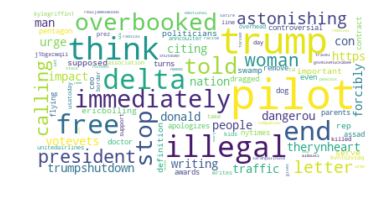

In [180]:
rt_wc = WordCloud(collocations=False, max_font_size=50, max_words=100, background_color="white").generate(rt_words)
plt.figure()
plt.imshow(rt_wc, interpolation="bilinear")
plt.axis("off")
plt.show()

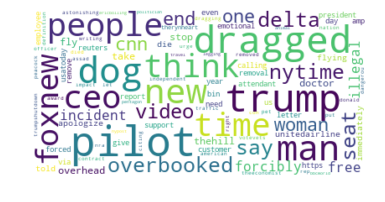

In [181]:
fav_wc = WordCloud(collocations=False, max_font_size=50, max_words=100, background_color="white").generate(fav_words)
plt.figure()
plt.imshow(fav_wc, interpolation="bilinear")
plt.axis("off")
plt.show()

# The End